In [1]:
# from google.colab import drive
# drive.mount('/content/drive/')

In [1]:
# !python -m pip install torchinfo

In [2]:
%pwd

'/home/hd2585/ondemand/cv-project'

In [35]:
%run /home/hd2585/ondemand/cv-project/Utils.ipynb

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import torchvision
import torchinfo
from torchvision import models
import torch.nn.init as init
import torch.optim as optim
import warnings
warnings.filterwarnings("ignore")

In [10]:
batch_size = 32
val_batch_size=5
device = 'cuda:0'

In [11]:
train_dataset = FinalDataset(X_path="/home/hd2585/ondemand/cv-project/L_256.pt", y_path="/home/hd2585/ondemand/cv-project/AB_256.pt")
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [36]:
val_dataset = FinalDataset(X_path="/home/hd2585/ondemand/cv-project/val_L_256.pt", y_path="/home/hd2585/ondemand/cv-project/val_AB_256.pt")
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=val_batch_size, num_workers=1)

In [13]:
class AttentionBlock(nn.Module):
    def __init__(self, upConv_out, en_out):
        super().__init__()

        self.w_K = nn.Sequential(nn.Conv2d(upConv_out, upConv_out, kernel_size=1), nn.BatchNorm2d(upConv_out))
        self.w_Q = nn.Sequential(nn.Conv2d(en_out, en_out, kernel_size=1), nn.BatchNorm2d(en_out))
        self.AtnnHead = nn.Sequential(nn.Conv2d(upConv_out, 1, kernel_size=1), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)

    def forward(self, upConv, encoder):
        K = self.w_K(upConv)
        Q = self.w_Q(encoder)
        D = self.relu(K+Q)
        D = self.AtnnHead(D)

        return upConv * D

In [14]:
class UNet(nn.Module):
  def __init__(self, block):
    super(UNet, self).__init__()
    self.conv = nn.Sequential(nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(), nn.BatchNorm2d(16))
    self.pool = nn.MaxPool2d(2, 2)                                               # Will halve the dim and twice the depth
    self.enAct = nn.ReLU()
    self.act = nn.LeakyReLU(0.3)
    self.out = nn.Tanh()
    self.en_layer_1 = residual_layer(block, 1, 16, 0.1)
    self.en_layer_2 = residual_layer(block, 1, 32, 0.1)
    self.en_layer_3 = residual_layer(block, 1, 64, 0.1)
    self.en_layer_4 = residual_layer(block, 1, 128, 0.1)
    self.en_layer_5 = residual_layer(block, 1, 256, 0.1)
    self.de_upConv_1 = nn.ConvTranspose2d(512, 256, 2, 2)                        # Will upsample the output of last layer
    self.de_batchnorm_1 = nn.BatchNorm2d(256)
    self.de_attn_head_1 = AttentionBlock(256, 256)
    self.de_conv_1_2 = nn.Conv2d(256, 256, 3, padding=1)
    self.de_batchnorm_1_2 = nn.BatchNorm2d(256)
    self.de_upConv_2 = nn.ConvTranspose2d(256, 128, 2, 2)
    self.de_batchnorm_2 = nn.BatchNorm2d(128)
    self.de_attn_head_2 = AttentionBlock(128, 128)
    self.de_conv_2_2 = nn.Conv2d(128, 128, 3, padding=1)
    self.de_batchnorm_2_2 = nn.BatchNorm2d(128)
    self.de_upConv_3 = nn.ConvTranspose2d(128, 64, 2, 2)
    self.de_batchnorm_3 = nn.BatchNorm2d(64)
    self.de_attn_head_3 = AttentionBlock(64, 64)
    self.de_conv_3_2 = nn.Conv2d(64, 64, 3, padding=1)
    self.de_batchnorm_3_2 = nn.BatchNorm2d(64)
    self.de_upConv_4 = nn.ConvTranspose2d(64, 32, 2, 2)
    self.de_batchnorm_4 = nn.BatchNorm2d(32)
    self.de_attn_head_4 = AttentionBlock(32, 32)
    self.de_conv_4_2 = nn.Conv2d(32, 32, 3, padding=1)
    self.de_batchnorm_4_2 = nn.BatchNorm2d(32)

    self.output_conv = nn.Conv2d(32, 2, 3, padding=1)
    self.out_batchnorm = nn.LayerNorm([2, 256, 256])

  def forward(self, x):
    x = self.conv(x)
    en_1 = self.en_layer_1(x)                                                    # Resnet block will output same dim images with double depth each turn; will pool after each resnet layer for dim/2
    x = self.pool(en_1)
    en_2 = self.en_layer_2(x)                                                    # These outputs will be concated with decoder layer, for better result as suggested in the paper
    x = self.pool(en_2)
    en_3 = self.en_layer_3(x)
    x = self.pool(en_3)
    en_4 = self.en_layer_4(x)
    x = self.pool(en_4)
    en_5 = self.en_layer_5(x)
    up_1 = self.de_upConv_1(en_5)                                                # The kernel and strides are chosen such that dim of feature doubles but we halve the depth
    up_1 = self.de_batchnorm_1(up_1)
    x = self.de_attn_head_1(up_1, en_4)                                          # Using attention instead of a decoder conv and concat
    x = self.act(self.de_conv_1_2(x))
    x = self.de_batchnorm_1_2(x)
    up_2 = self.de_upConv_2(x)
    up_2 = self.de_batchnorm_2(up_2)
    x = self.de_attn_head_2(up_2, en_3)
    x = self.act(self.de_conv_2_2(x))
    x = self.de_batchnorm_2_2(x)
    up_3 = self.de_upConv_3(en_3)
    up_3 = self.de_batchnorm_3(up_3)
    x = self.de_attn_head_3(up_3, en_2)
    x = self.act(self.de_conv_3_2(x))
    x = self.de_batchnorm_3_2(x)
    up_4 = self.de_upConv_4(x)
    up_4 = self.de_batchnorm_4(up_4)
    x = self.de_attn_head_4(up_4, en_1)
    x = self.act(self.de_conv_4_2(x))
    x = self.de_batchnorm_4_2(x)

    x = self.output_conv(x)
    x = self.out_batchnorm(x)

    return self.out(x)

In [16]:
def val_model(model, showImages):
  avg_loss = 0
  l1_mae = nn.L1Loss()
  batch_count = 0
  for (X, y) in val_loader:
    X = X.to(device)
    y = y.to(device)

    pred = model(X)

    avg_loss += l1_mae(pred, y).item()

    if(showImages):
        imshow(X, y)
        imshow(X, model(X))
        batch_count = 1
        break;
    batch_count+= 1

  return avg_loss / batch_count

In [17]:
# model = UNet(ResidualBlock)
# optimiser = optim.Adam(model.parameters(), lr=2e-4, betas=(0.5, 0.999))
# optimiser_500 = optim.Adam(model.parameters(), lr=2e-6, betas=(0.5, 0.999))
# # scheduler = lr_scheduler.StepLR(optimiser, step_size=20, gamma=0.1)
# model.to(device)
# loss_list = []
# val_loss_list = []

model = UNet(ResidualBlock)
model.load_state_dict(torch.load('/home/hd2585/ondemand/cv-project/attnunet/AttnUNet_2.8k.pth'))
model.to(device)
loss_list = torch.load('/home/hd2585/ondemand/cv-project/attnunet/attentionunet_training_loss.pth')
val_loss_list = torch.load('/home/hd2585/ondemand/cv-project/attnunet/attentionunet_validation_loss.pth')

def train_model(num_epochs, model):
  l1_loss = nn.L1Loss()
  model.train()
  for epoch in range(num_epochs):
    epoch_loss = 0
    # epoch += 1785
    for batch_idx, (X, y) in enumerate(train_loader):
        X = X.to(device)
        y = y.to(device)

        # prediction from both models
        if(epoch < 500):
            optimiser.zero_grad()
        else:
            optimiser_500.zero_grad()
        pred = model(X)

        # Calculating loss for each net
        loss = l1_loss(pred, y)

        # Loss backwards and calling the optimiser
        loss.backward()

        epoch_loss += loss.item()

        if(epoch < 500):
            optimiser.step()
        else:
            optimiser_500.step()

        # if(epoch < 40):
        #     scheduler.step()

        if batch_idx % 10 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tUNetLoss: {:.6f}'.format(
              epoch, batch_idx * len(X), len(train_loader.dataset),
              100. * batch_idx / len(train_loader), loss.item()))

    loss_list.append(epoch_loss)
    val_loss_list.append(val_model(model, False))
    if epoch %50 == 0:
        print("Training Output: ")
        imshow(X, y)
        imshow(X, model(X))
        print("validation Output: ")
        val_model(model, True)
    if epoch % 50 == 0:
      saveModel(model, '/home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_' + str(epoch) + '.pth')
      torch.save(loss_list, '/home/hd2585/ondemand/cv-project/attnunet/attentionunet_training_loss.pth')
      torch.save(val_loss_list, '/home/hd2585/ondemand/cv-project/attnunet/attentionunet_validation_loss.pth')

  return (loss_list, val_loss_list)

Train Epoch: 0 [0/256 (0%)]	UNetLoss: 0.461725
Training Output: 


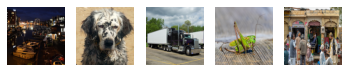

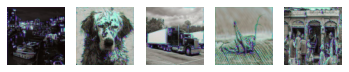

validation Output: 


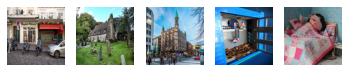

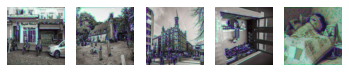


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_0.pth.
Train Epoch: 1 [0/256 (0%)]	UNetLoss: 0.261186
Train Epoch: 2 [0/256 (0%)]	UNetLoss: 0.183065
Train Epoch: 3 [0/256 (0%)]	UNetLoss: 0.168880
Train Epoch: 4 [0/256 (0%)]	UNetLoss: 0.153344
Train Epoch: 5 [0/256 (0%)]	UNetLoss: 0.124661
Train Epoch: 6 [0/256 (0%)]	UNetLoss: 0.128451
Train Epoch: 7 [0/256 (0%)]	UNetLoss: 0.149626
Train Epoch: 8 [0/256 (0%)]	UNetLoss: 0.118344
Train Epoch: 9 [0/256 (0%)]	UNetLoss: 0.111596
Train Epoch: 10 [0/256 (0%)]	UNetLoss: 0.127690
Train Epoch: 11 [0/256 (0%)]	UNetLoss: 0.108640
Train Epoch: 12 [0/256 (0%)]	UNetLoss: 0.108111
Train Epoch: 13 [0/256 (0%)]	UNetLoss: 0.103582
Train Epoch: 14 [0/256 (0%)]	UNetLoss: 0.102600
Train Epoch: 15 [0/256 (0%)]	UNetLoss: 0.130510
Train Epoch: 16 [0/256 (0%)]	UNetLoss: 0.107457
Train Epoch: 17 [0/256 (0%)]	UNetLoss: 0.113767
Train Epoch: 18 [0/256 (0%)]	UNetLoss: 0.109443
Train Epoch: 19 [0/256 (0%)]	UNetLoss: 0.099315
Train Epoch: 20 [0

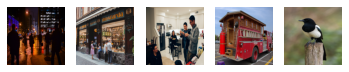

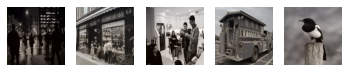

validation Output: 


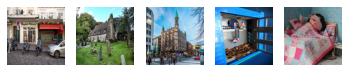

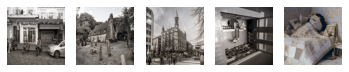


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_50.pth.
Train Epoch: 51 [0/256 (0%)]	UNetLoss: 0.113290
Train Epoch: 52 [0/256 (0%)]	UNetLoss: 0.100832
Train Epoch: 53 [0/256 (0%)]	UNetLoss: 0.092165
Train Epoch: 54 [0/256 (0%)]	UNetLoss: 0.100636
Train Epoch: 55 [0/256 (0%)]	UNetLoss: 0.094639
Train Epoch: 56 [0/256 (0%)]	UNetLoss: 0.109490
Train Epoch: 57 [0/256 (0%)]	UNetLoss: 0.100898
Train Epoch: 58 [0/256 (0%)]	UNetLoss: 0.096266
Train Epoch: 59 [0/256 (0%)]	UNetLoss: 0.111912
Train Epoch: 60 [0/256 (0%)]	UNetLoss: 0.088062
Train Epoch: 61 [0/256 (0%)]	UNetLoss: 0.099945
Train Epoch: 62 [0/256 (0%)]	UNetLoss: 0.100398
Train Epoch: 63 [0/256 (0%)]	UNetLoss: 0.086227
Train Epoch: 64 [0/256 (0%)]	UNetLoss: 0.100133
Train Epoch: 65 [0/256 (0%)]	UNetLoss: 0.095014
Train Epoch: 66 [0/256 (0%)]	UNetLoss: 0.107427
Train Epoch: 67 [0/256 (0%)]	UNetLoss: 0.081988
Train Epoch: 68 [0/256 (0%)]	UNetLoss: 0.079802
Train Epoch: 69 [0/256 (0%)]	UNetLoss: 0.099964
Train Ep

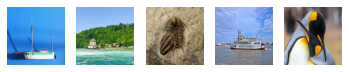

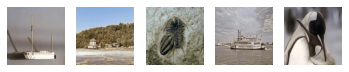

validation Output: 


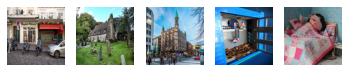

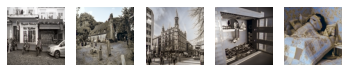


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_100.pth.
Train Epoch: 101 [0/256 (0%)]	UNetLoss: 0.095052
Train Epoch: 102 [0/256 (0%)]	UNetLoss: 0.084906
Train Epoch: 103 [0/256 (0%)]	UNetLoss: 0.101174
Train Epoch: 104 [0/256 (0%)]	UNetLoss: 0.083586
Train Epoch: 105 [0/256 (0%)]	UNetLoss: 0.104897
Train Epoch: 106 [0/256 (0%)]	UNetLoss: 0.117161
Train Epoch: 107 [0/256 (0%)]	UNetLoss: 0.098636
Train Epoch: 108 [0/256 (0%)]	UNetLoss: 0.112971
Train Epoch: 109 [0/256 (0%)]	UNetLoss: 0.090233
Train Epoch: 110 [0/256 (0%)]	UNetLoss: 0.109390
Train Epoch: 111 [0/256 (0%)]	UNetLoss: 0.088685
Train Epoch: 112 [0/256 (0%)]	UNetLoss: 0.096232
Train Epoch: 113 [0/256 (0%)]	UNetLoss: 0.108701
Train Epoch: 114 [0/256 (0%)]	UNetLoss: 0.105212
Train Epoch: 115 [0/256 (0%)]	UNetLoss: 0.103357
Train Epoch: 116 [0/256 (0%)]	UNetLoss: 0.093211
Train Epoch: 117 [0/256 (0%)]	UNetLoss: 0.090950
Train Epoch: 118 [0/256 (0%)]	UNetLoss: 0.093740
Train Epoch: 119 [0/256 (0%)]	UNetLos

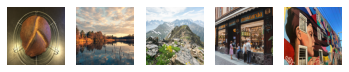

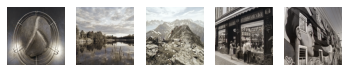

validation Output: 


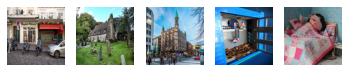

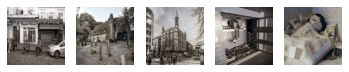


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_150.pth.
Train Epoch: 151 [0/256 (0%)]	UNetLoss: 0.097296
Train Epoch: 152 [0/256 (0%)]	UNetLoss: 0.088675
Train Epoch: 153 [0/256 (0%)]	UNetLoss: 0.102110
Train Epoch: 154 [0/256 (0%)]	UNetLoss: 0.095673
Train Epoch: 155 [0/256 (0%)]	UNetLoss: 0.086391
Train Epoch: 156 [0/256 (0%)]	UNetLoss: 0.080783
Train Epoch: 157 [0/256 (0%)]	UNetLoss: 0.096651
Train Epoch: 158 [0/256 (0%)]	UNetLoss: 0.094158
Train Epoch: 159 [0/256 (0%)]	UNetLoss: 0.093216
Train Epoch: 160 [0/256 (0%)]	UNetLoss: 0.090679
Train Epoch: 161 [0/256 (0%)]	UNetLoss: 0.088606
Train Epoch: 162 [0/256 (0%)]	UNetLoss: 0.106343
Train Epoch: 163 [0/256 (0%)]	UNetLoss: 0.116502
Train Epoch: 164 [0/256 (0%)]	UNetLoss: 0.100125
Train Epoch: 165 [0/256 (0%)]	UNetLoss: 0.086152
Train Epoch: 166 [0/256 (0%)]	UNetLoss: 0.088289
Train Epoch: 167 [0/256 (0%)]	UNetLoss: 0.087759
Train Epoch: 168 [0/256 (0%)]	UNetLoss: 0.098778
Train Epoch: 169 [0/256 (0%)]	UNetLos

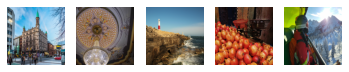

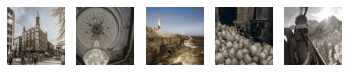

validation Output: 


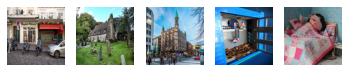

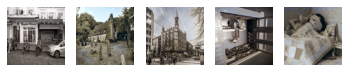


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_200.pth.
Train Epoch: 201 [0/256 (0%)]	UNetLoss: 0.100305
Train Epoch: 202 [0/256 (0%)]	UNetLoss: 0.085348
Train Epoch: 203 [0/256 (0%)]	UNetLoss: 0.108020
Train Epoch: 204 [0/256 (0%)]	UNetLoss: 0.078965
Train Epoch: 205 [0/256 (0%)]	UNetLoss: 0.094759
Train Epoch: 206 [0/256 (0%)]	UNetLoss: 0.088087
Train Epoch: 207 [0/256 (0%)]	UNetLoss: 0.103018
Train Epoch: 208 [0/256 (0%)]	UNetLoss: 0.100494
Train Epoch: 209 [0/256 (0%)]	UNetLoss: 0.082703
Train Epoch: 210 [0/256 (0%)]	UNetLoss: 0.105793
Train Epoch: 211 [0/256 (0%)]	UNetLoss: 0.097083
Train Epoch: 212 [0/256 (0%)]	UNetLoss: 0.100016
Train Epoch: 213 [0/256 (0%)]	UNetLoss: 0.087465
Train Epoch: 214 [0/256 (0%)]	UNetLoss: 0.089599
Train Epoch: 215 [0/256 (0%)]	UNetLoss: 0.094326
Train Epoch: 216 [0/256 (0%)]	UNetLoss: 0.092140
Train Epoch: 217 [0/256 (0%)]	UNetLoss: 0.090113
Train Epoch: 218 [0/256 (0%)]	UNetLoss: 0.099676
Train Epoch: 219 [0/256 (0%)]	UNetLos

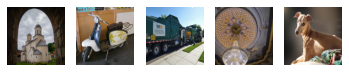

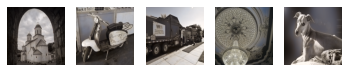

validation Output: 


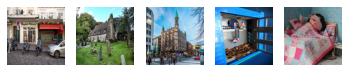

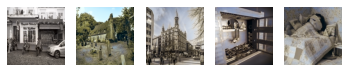


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_250.pth.
Train Epoch: 251 [0/256 (0%)]	UNetLoss: 0.084879
Train Epoch: 252 [0/256 (0%)]	UNetLoss: 0.098454
Train Epoch: 253 [0/256 (0%)]	UNetLoss: 0.087168
Train Epoch: 254 [0/256 (0%)]	UNetLoss: 0.092225
Train Epoch: 255 [0/256 (0%)]	UNetLoss: 0.089052
Train Epoch: 256 [0/256 (0%)]	UNetLoss: 0.109836
Train Epoch: 257 [0/256 (0%)]	UNetLoss: 0.110594
Train Epoch: 258 [0/256 (0%)]	UNetLoss: 0.112546
Train Epoch: 259 [0/256 (0%)]	UNetLoss: 0.094511
Train Epoch: 260 [0/256 (0%)]	UNetLoss: 0.106234
Train Epoch: 261 [0/256 (0%)]	UNetLoss: 0.099641
Train Epoch: 262 [0/256 (0%)]	UNetLoss: 0.097726
Train Epoch: 263 [0/256 (0%)]	UNetLoss: 0.094811
Train Epoch: 264 [0/256 (0%)]	UNetLoss: 0.097214
Train Epoch: 265 [0/256 (0%)]	UNetLoss: 0.081646
Train Epoch: 266 [0/256 (0%)]	UNetLoss: 0.076914
Train Epoch: 267 [0/256 (0%)]	UNetLoss: 0.100984
Train Epoch: 268 [0/256 (0%)]	UNetLoss: 0.080019
Train Epoch: 269 [0/256 (0%)]	UNetLos

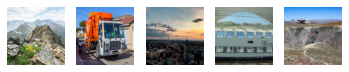

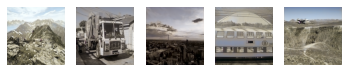

validation Output: 


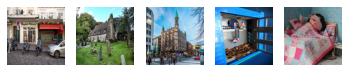

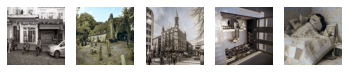


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_300.pth.
Train Epoch: 301 [0/256 (0%)]	UNetLoss: 0.096634
Train Epoch: 302 [0/256 (0%)]	UNetLoss: 0.086651
Train Epoch: 303 [0/256 (0%)]	UNetLoss: 0.079921
Train Epoch: 304 [0/256 (0%)]	UNetLoss: 0.098178
Train Epoch: 305 [0/256 (0%)]	UNetLoss: 0.094415
Train Epoch: 306 [0/256 (0%)]	UNetLoss: 0.090306
Train Epoch: 307 [0/256 (0%)]	UNetLoss: 0.082684
Train Epoch: 308 [0/256 (0%)]	UNetLoss: 0.086781
Train Epoch: 309 [0/256 (0%)]	UNetLoss: 0.083635
Train Epoch: 310 [0/256 (0%)]	UNetLoss: 0.101218
Train Epoch: 311 [0/256 (0%)]	UNetLoss: 0.082067
Train Epoch: 312 [0/256 (0%)]	UNetLoss: 0.084072
Train Epoch: 313 [0/256 (0%)]	UNetLoss: 0.092630
Train Epoch: 314 [0/256 (0%)]	UNetLoss: 0.100813
Train Epoch: 315 [0/256 (0%)]	UNetLoss: 0.088818
Train Epoch: 316 [0/256 (0%)]	UNetLoss: 0.100718
Train Epoch: 317 [0/256 (0%)]	UNetLoss: 0.089872
Train Epoch: 318 [0/256 (0%)]	UNetLoss: 0.084598
Train Epoch: 319 [0/256 (0%)]	UNetLos

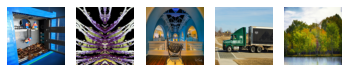

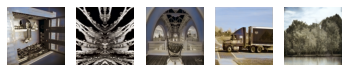

validation Output: 


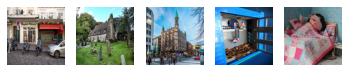

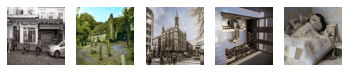


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_350.pth.
Train Epoch: 351 [0/256 (0%)]	UNetLoss: 0.101792
Train Epoch: 352 [0/256 (0%)]	UNetLoss: 0.091695
Train Epoch: 353 [0/256 (0%)]	UNetLoss: 0.093699
Train Epoch: 354 [0/256 (0%)]	UNetLoss: 0.103657
Train Epoch: 355 [0/256 (0%)]	UNetLoss: 0.093132
Train Epoch: 356 [0/256 (0%)]	UNetLoss: 0.086995
Train Epoch: 357 [0/256 (0%)]	UNetLoss: 0.095019
Train Epoch: 358 [0/256 (0%)]	UNetLoss: 0.092753
Train Epoch: 359 [0/256 (0%)]	UNetLoss: 0.113701
Train Epoch: 360 [0/256 (0%)]	UNetLoss: 0.086440
Train Epoch: 361 [0/256 (0%)]	UNetLoss: 0.092928
Train Epoch: 362 [0/256 (0%)]	UNetLoss: 0.093012
Train Epoch: 363 [0/256 (0%)]	UNetLoss: 0.102672
Train Epoch: 364 [0/256 (0%)]	UNetLoss: 0.098269
Train Epoch: 365 [0/256 (0%)]	UNetLoss: 0.097824
Train Epoch: 366 [0/256 (0%)]	UNetLoss: 0.088706
Train Epoch: 367 [0/256 (0%)]	UNetLoss: 0.101615
Train Epoch: 368 [0/256 (0%)]	UNetLoss: 0.071558
Train Epoch: 369 [0/256 (0%)]	UNetLos

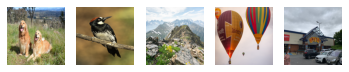

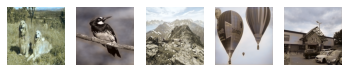

validation Output: 


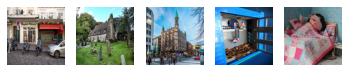

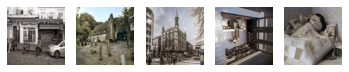


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_400.pth.
Train Epoch: 401 [0/256 (0%)]	UNetLoss: 0.088647
Train Epoch: 402 [0/256 (0%)]	UNetLoss: 0.086697
Train Epoch: 403 [0/256 (0%)]	UNetLoss: 0.096175
Train Epoch: 404 [0/256 (0%)]	UNetLoss: 0.092708
Train Epoch: 405 [0/256 (0%)]	UNetLoss: 0.102123
Train Epoch: 406 [0/256 (0%)]	UNetLoss: 0.090095
Train Epoch: 407 [0/256 (0%)]	UNetLoss: 0.089313
Train Epoch: 408 [0/256 (0%)]	UNetLoss: 0.083265
Train Epoch: 409 [0/256 (0%)]	UNetLoss: 0.086982
Train Epoch: 410 [0/256 (0%)]	UNetLoss: 0.084842
Train Epoch: 411 [0/256 (0%)]	UNetLoss: 0.115241
Train Epoch: 412 [0/256 (0%)]	UNetLoss: 0.093996
Train Epoch: 413 [0/256 (0%)]	UNetLoss: 0.077155
Train Epoch: 414 [0/256 (0%)]	UNetLoss: 0.096134
Train Epoch: 415 [0/256 (0%)]	UNetLoss: 0.096111
Train Epoch: 416 [0/256 (0%)]	UNetLoss: 0.090429
Train Epoch: 417 [0/256 (0%)]	UNetLoss: 0.102210
Train Epoch: 418 [0/256 (0%)]	UNetLoss: 0.101843
Train Epoch: 419 [0/256 (0%)]	UNetLos

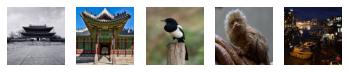

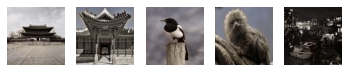

validation Output: 


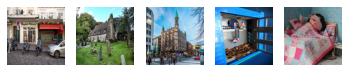

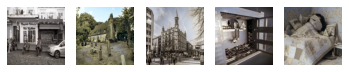


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_450.pth.
Train Epoch: 451 [0/256 (0%)]	UNetLoss: 0.081558
Train Epoch: 452 [0/256 (0%)]	UNetLoss: 0.085715
Train Epoch: 453 [0/256 (0%)]	UNetLoss: 0.089019
Train Epoch: 454 [0/256 (0%)]	UNetLoss: 0.091615
Train Epoch: 455 [0/256 (0%)]	UNetLoss: 0.113881
Train Epoch: 456 [0/256 (0%)]	UNetLoss: 0.089367
Train Epoch: 457 [0/256 (0%)]	UNetLoss: 0.073331
Train Epoch: 458 [0/256 (0%)]	UNetLoss: 0.083082
Train Epoch: 459 [0/256 (0%)]	UNetLoss: 0.103283
Train Epoch: 460 [0/256 (0%)]	UNetLoss: 0.099437
Train Epoch: 461 [0/256 (0%)]	UNetLoss: 0.108288
Train Epoch: 462 [0/256 (0%)]	UNetLoss: 0.089149
Train Epoch: 463 [0/256 (0%)]	UNetLoss: 0.083824
Train Epoch: 464 [0/256 (0%)]	UNetLoss: 0.106142
Train Epoch: 465 [0/256 (0%)]	UNetLoss: 0.083876
Train Epoch: 466 [0/256 (0%)]	UNetLoss: 0.096728
Train Epoch: 467 [0/256 (0%)]	UNetLoss: 0.092599
Train Epoch: 468 [0/256 (0%)]	UNetLoss: 0.087412
Train Epoch: 469 [0/256 (0%)]	UNetLos

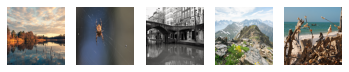

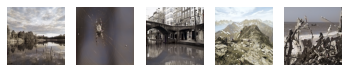

validation Output: 


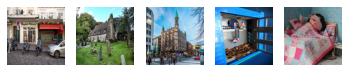

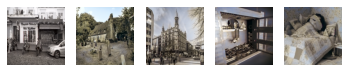


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_500.pth.
Train Epoch: 501 [0/256 (0%)]	UNetLoss: 0.080325
Train Epoch: 502 [0/256 (0%)]	UNetLoss: 0.094182
Train Epoch: 503 [0/256 (0%)]	UNetLoss: 0.089742
Train Epoch: 504 [0/256 (0%)]	UNetLoss: 0.077288
Train Epoch: 505 [0/256 (0%)]	UNetLoss: 0.092443
Train Epoch: 506 [0/256 (0%)]	UNetLoss: 0.088051
Train Epoch: 507 [0/256 (0%)]	UNetLoss: 0.086355
Train Epoch: 508 [0/256 (0%)]	UNetLoss: 0.083857
Train Epoch: 509 [0/256 (0%)]	UNetLoss: 0.091630
Train Epoch: 510 [0/256 (0%)]	UNetLoss: 0.099636
Train Epoch: 511 [0/256 (0%)]	UNetLoss: 0.108316
Train Epoch: 512 [0/256 (0%)]	UNetLoss: 0.092764
Train Epoch: 513 [0/256 (0%)]	UNetLoss: 0.088361
Train Epoch: 514 [0/256 (0%)]	UNetLoss: 0.076087
Train Epoch: 515 [0/256 (0%)]	UNetLoss: 0.096210
Train Epoch: 516 [0/256 (0%)]	UNetLoss: 0.095185
Train Epoch: 517 [0/256 (0%)]	UNetLoss: 0.098584
Train Epoch: 518 [0/256 (0%)]	UNetLoss: 0.090337
Train Epoch: 519 [0/256 (0%)]	UNetLos

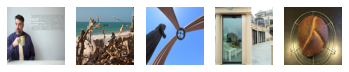

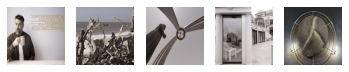

validation Output: 


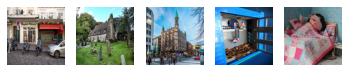

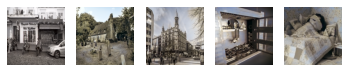


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_550.pth.
Train Epoch: 551 [0/256 (0%)]	UNetLoss: 0.086705
Train Epoch: 552 [0/256 (0%)]	UNetLoss: 0.088294
Train Epoch: 553 [0/256 (0%)]	UNetLoss: 0.089324
Train Epoch: 554 [0/256 (0%)]	UNetLoss: 0.084845
Train Epoch: 555 [0/256 (0%)]	UNetLoss: 0.084512
Train Epoch: 556 [0/256 (0%)]	UNetLoss: 0.085458
Train Epoch: 557 [0/256 (0%)]	UNetLoss: 0.085262
Train Epoch: 558 [0/256 (0%)]	UNetLoss: 0.075680
Train Epoch: 559 [0/256 (0%)]	UNetLoss: 0.085689
Train Epoch: 560 [0/256 (0%)]	UNetLoss: 0.087239
Train Epoch: 561 [0/256 (0%)]	UNetLoss: 0.089274
Train Epoch: 562 [0/256 (0%)]	UNetLoss: 0.073684
Train Epoch: 563 [0/256 (0%)]	UNetLoss: 0.090350
Train Epoch: 564 [0/256 (0%)]	UNetLoss: 0.094790
Train Epoch: 565 [0/256 (0%)]	UNetLoss: 0.095427
Train Epoch: 566 [0/256 (0%)]	UNetLoss: 0.098109
Train Epoch: 567 [0/256 (0%)]	UNetLoss: 0.109115
Train Epoch: 568 [0/256 (0%)]	UNetLoss: 0.080712
Train Epoch: 569 [0/256 (0%)]	UNetLos

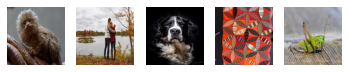

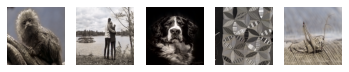

validation Output: 


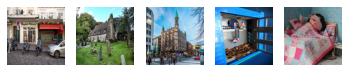

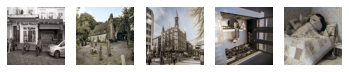


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_600.pth.
Train Epoch: 601 [0/256 (0%)]	UNetLoss: 0.087403
Train Epoch: 602 [0/256 (0%)]	UNetLoss: 0.077353
Train Epoch: 603 [0/256 (0%)]	UNetLoss: 0.099624
Train Epoch: 604 [0/256 (0%)]	UNetLoss: 0.105928
Train Epoch: 605 [0/256 (0%)]	UNetLoss: 0.084940
Train Epoch: 606 [0/256 (0%)]	UNetLoss: 0.088542
Train Epoch: 607 [0/256 (0%)]	UNetLoss: 0.087376
Train Epoch: 608 [0/256 (0%)]	UNetLoss: 0.089851
Train Epoch: 609 [0/256 (0%)]	UNetLoss: 0.092004
Train Epoch: 610 [0/256 (0%)]	UNetLoss: 0.088744
Train Epoch: 611 [0/256 (0%)]	UNetLoss: 0.088414
Train Epoch: 612 [0/256 (0%)]	UNetLoss: 0.094819
Train Epoch: 613 [0/256 (0%)]	UNetLoss: 0.084892
Train Epoch: 614 [0/256 (0%)]	UNetLoss: 0.089639
Train Epoch: 615 [0/256 (0%)]	UNetLoss: 0.094302
Train Epoch: 616 [0/256 (0%)]	UNetLoss: 0.094798
Train Epoch: 617 [0/256 (0%)]	UNetLoss: 0.096642
Train Epoch: 618 [0/256 (0%)]	UNetLoss: 0.088587
Train Epoch: 619 [0/256 (0%)]	UNetLos

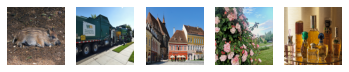

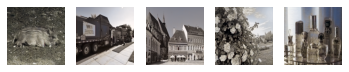

validation Output: 


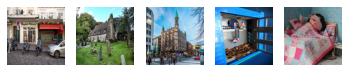

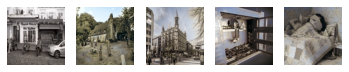


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_650.pth.
Train Epoch: 651 [0/256 (0%)]	UNetLoss: 0.108579
Train Epoch: 652 [0/256 (0%)]	UNetLoss: 0.083596
Train Epoch: 653 [0/256 (0%)]	UNetLoss: 0.099106
Train Epoch: 654 [0/256 (0%)]	UNetLoss: 0.085995
Train Epoch: 655 [0/256 (0%)]	UNetLoss: 0.098186
Train Epoch: 656 [0/256 (0%)]	UNetLoss: 0.094045
Train Epoch: 657 [0/256 (0%)]	UNetLoss: 0.080470
Train Epoch: 658 [0/256 (0%)]	UNetLoss: 0.084482
Train Epoch: 659 [0/256 (0%)]	UNetLoss: 0.087377
Train Epoch: 660 [0/256 (0%)]	UNetLoss: 0.081206
Train Epoch: 661 [0/256 (0%)]	UNetLoss: 0.086267
Train Epoch: 662 [0/256 (0%)]	UNetLoss: 0.079305
Train Epoch: 663 [0/256 (0%)]	UNetLoss: 0.089846
Train Epoch: 664 [0/256 (0%)]	UNetLoss: 0.092900
Train Epoch: 665 [0/256 (0%)]	UNetLoss: 0.102788
Train Epoch: 666 [0/256 (0%)]	UNetLoss: 0.082904
Train Epoch: 667 [0/256 (0%)]	UNetLoss: 0.096025
Train Epoch: 668 [0/256 (0%)]	UNetLoss: 0.093178
Train Epoch: 669 [0/256 (0%)]	UNetLos

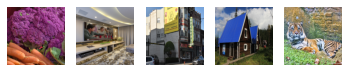

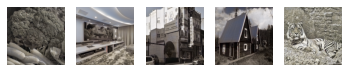

validation Output: 


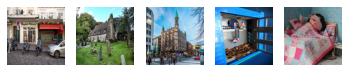

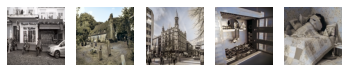


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_700.pth.
Train Epoch: 701 [0/256 (0%)]	UNetLoss: 0.088981
Train Epoch: 702 [0/256 (0%)]	UNetLoss: 0.100148
Train Epoch: 703 [0/256 (0%)]	UNetLoss: 0.087772
Train Epoch: 704 [0/256 (0%)]	UNetLoss: 0.082094
Train Epoch: 705 [0/256 (0%)]	UNetLoss: 0.081221
Train Epoch: 706 [0/256 (0%)]	UNetLoss: 0.088761
Train Epoch: 707 [0/256 (0%)]	UNetLoss: 0.102340
Train Epoch: 708 [0/256 (0%)]	UNetLoss: 0.082237
Train Epoch: 709 [0/256 (0%)]	UNetLoss: 0.097047
Train Epoch: 710 [0/256 (0%)]	UNetLoss: 0.078105
Train Epoch: 711 [0/256 (0%)]	UNetLoss: 0.089327
Train Epoch: 712 [0/256 (0%)]	UNetLoss: 0.085779
Train Epoch: 713 [0/256 (0%)]	UNetLoss: 0.081365
Train Epoch: 714 [0/256 (0%)]	UNetLoss: 0.074573
Train Epoch: 715 [0/256 (0%)]	UNetLoss: 0.075740
Train Epoch: 716 [0/256 (0%)]	UNetLoss: 0.094651
Train Epoch: 717 [0/256 (0%)]	UNetLoss: 0.094299
Train Epoch: 718 [0/256 (0%)]	UNetLoss: 0.076392
Train Epoch: 719 [0/256 (0%)]	UNetLos

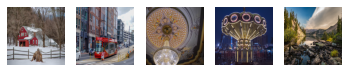

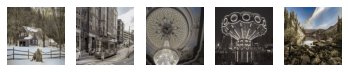

validation Output: 


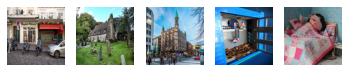

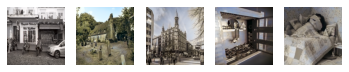


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_750.pth.
Train Epoch: 751 [0/256 (0%)]	UNetLoss: 0.084115
Train Epoch: 752 [0/256 (0%)]	UNetLoss: 0.085347
Train Epoch: 753 [0/256 (0%)]	UNetLoss: 0.083633
Train Epoch: 754 [0/256 (0%)]	UNetLoss: 0.073142
Train Epoch: 755 [0/256 (0%)]	UNetLoss: 0.086955
Train Epoch: 756 [0/256 (0%)]	UNetLoss: 0.098337
Train Epoch: 757 [0/256 (0%)]	UNetLoss: 0.083832
Train Epoch: 758 [0/256 (0%)]	UNetLoss: 0.088691
Train Epoch: 759 [0/256 (0%)]	UNetLoss: 0.079079
Train Epoch: 760 [0/256 (0%)]	UNetLoss: 0.086012
Train Epoch: 761 [0/256 (0%)]	UNetLoss: 0.091729
Train Epoch: 762 [0/256 (0%)]	UNetLoss: 0.096054
Train Epoch: 763 [0/256 (0%)]	UNetLoss: 0.080015
Train Epoch: 764 [0/256 (0%)]	UNetLoss: 0.086745
Train Epoch: 765 [0/256 (0%)]	UNetLoss: 0.087851
Train Epoch: 766 [0/256 (0%)]	UNetLoss: 0.084172
Train Epoch: 767 [0/256 (0%)]	UNetLoss: 0.088391
Train Epoch: 768 [0/256 (0%)]	UNetLoss: 0.089205
Train Epoch: 769 [0/256 (0%)]	UNetLos

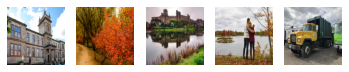

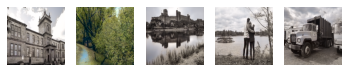

validation Output: 


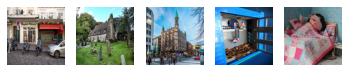

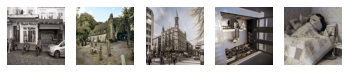


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_800.pth.
Train Epoch: 801 [0/256 (0%)]	UNetLoss: 0.085936
Train Epoch: 802 [0/256 (0%)]	UNetLoss: 0.072404
Train Epoch: 803 [0/256 (0%)]	UNetLoss: 0.080285
Train Epoch: 804 [0/256 (0%)]	UNetLoss: 0.074885
Train Epoch: 805 [0/256 (0%)]	UNetLoss: 0.084105
Train Epoch: 806 [0/256 (0%)]	UNetLoss: 0.093819
Train Epoch: 807 [0/256 (0%)]	UNetLoss: 0.076932
Train Epoch: 808 [0/256 (0%)]	UNetLoss: 0.081088
Train Epoch: 809 [0/256 (0%)]	UNetLoss: 0.088487
Train Epoch: 810 [0/256 (0%)]	UNetLoss: 0.077337
Train Epoch: 811 [0/256 (0%)]	UNetLoss: 0.079161
Train Epoch: 812 [0/256 (0%)]	UNetLoss: 0.075902
Train Epoch: 813 [0/256 (0%)]	UNetLoss: 0.094204
Train Epoch: 814 [0/256 (0%)]	UNetLoss: 0.091258
Train Epoch: 815 [0/256 (0%)]	UNetLoss: 0.073869
Train Epoch: 816 [0/256 (0%)]	UNetLoss: 0.097496
Train Epoch: 817 [0/256 (0%)]	UNetLoss: 0.096490
Train Epoch: 818 [0/256 (0%)]	UNetLoss: 0.101684
Train Epoch: 819 [0/256 (0%)]	UNetLos

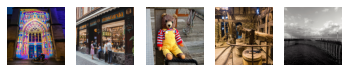

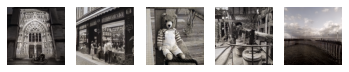

validation Output: 


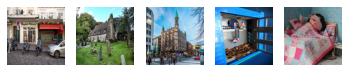

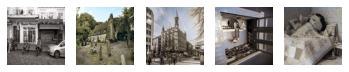


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_850.pth.
Train Epoch: 851 [0/256 (0%)]	UNetLoss: 0.087690
Train Epoch: 852 [0/256 (0%)]	UNetLoss: 0.108062
Train Epoch: 853 [0/256 (0%)]	UNetLoss: 0.090389
Train Epoch: 854 [0/256 (0%)]	UNetLoss: 0.091119
Train Epoch: 855 [0/256 (0%)]	UNetLoss: 0.081669
Train Epoch: 856 [0/256 (0%)]	UNetLoss: 0.100433
Train Epoch: 857 [0/256 (0%)]	UNetLoss: 0.097801
Train Epoch: 858 [0/256 (0%)]	UNetLoss: 0.095129
Train Epoch: 859 [0/256 (0%)]	UNetLoss: 0.080191
Train Epoch: 860 [0/256 (0%)]	UNetLoss: 0.086674
Train Epoch: 861 [0/256 (0%)]	UNetLoss: 0.086644
Train Epoch: 862 [0/256 (0%)]	UNetLoss: 0.107168
Train Epoch: 863 [0/256 (0%)]	UNetLoss: 0.084873
Train Epoch: 864 [0/256 (0%)]	UNetLoss: 0.083523
Train Epoch: 865 [0/256 (0%)]	UNetLoss: 0.085232
Train Epoch: 866 [0/256 (0%)]	UNetLoss: 0.084295
Train Epoch: 867 [0/256 (0%)]	UNetLoss: 0.090738
Train Epoch: 868 [0/256 (0%)]	UNetLoss: 0.083210
Train Epoch: 869 [0/256 (0%)]	UNetLos

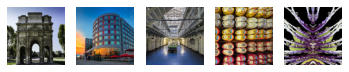

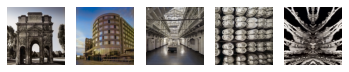

validation Output: 


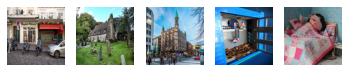

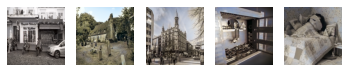


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_900.pth.
Train Epoch: 901 [0/256 (0%)]	UNetLoss: 0.080301
Train Epoch: 902 [0/256 (0%)]	UNetLoss: 0.070889
Train Epoch: 903 [0/256 (0%)]	UNetLoss: 0.089584
Train Epoch: 904 [0/256 (0%)]	UNetLoss: 0.091877
Train Epoch: 905 [0/256 (0%)]	UNetLoss: 0.090718
Train Epoch: 906 [0/256 (0%)]	UNetLoss: 0.093713
Train Epoch: 907 [0/256 (0%)]	UNetLoss: 0.084513
Train Epoch: 908 [0/256 (0%)]	UNetLoss: 0.096854
Train Epoch: 909 [0/256 (0%)]	UNetLoss: 0.077747
Train Epoch: 910 [0/256 (0%)]	UNetLoss: 0.085399
Train Epoch: 911 [0/256 (0%)]	UNetLoss: 0.093625
Train Epoch: 912 [0/256 (0%)]	UNetLoss: 0.095792
Train Epoch: 913 [0/256 (0%)]	UNetLoss: 0.087736
Train Epoch: 914 [0/256 (0%)]	UNetLoss: 0.076638
Train Epoch: 915 [0/256 (0%)]	UNetLoss: 0.097179
Train Epoch: 916 [0/256 (0%)]	UNetLoss: 0.087059
Train Epoch: 917 [0/256 (0%)]	UNetLoss: 0.085032
Train Epoch: 918 [0/256 (0%)]	UNetLoss: 0.097526
Train Epoch: 919 [0/256 (0%)]	UNetLos

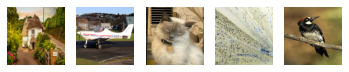

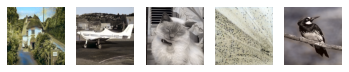

validation Output: 


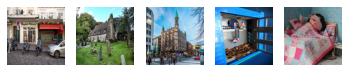

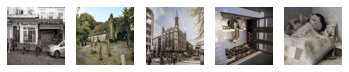


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_950.pth.
Train Epoch: 951 [0/256 (0%)]	UNetLoss: 0.087820
Train Epoch: 952 [0/256 (0%)]	UNetLoss: 0.082709
Train Epoch: 953 [0/256 (0%)]	UNetLoss: 0.080186
Train Epoch: 954 [0/256 (0%)]	UNetLoss: 0.079462
Train Epoch: 955 [0/256 (0%)]	UNetLoss: 0.105765
Train Epoch: 956 [0/256 (0%)]	UNetLoss: 0.092259
Train Epoch: 957 [0/256 (0%)]	UNetLoss: 0.081854
Train Epoch: 958 [0/256 (0%)]	UNetLoss: 0.084826
Train Epoch: 959 [0/256 (0%)]	UNetLoss: 0.094008
Train Epoch: 960 [0/256 (0%)]	UNetLoss: 0.087743
Train Epoch: 961 [0/256 (0%)]	UNetLoss: 0.090420
Train Epoch: 962 [0/256 (0%)]	UNetLoss: 0.084951
Train Epoch: 963 [0/256 (0%)]	UNetLoss: 0.084856
Train Epoch: 964 [0/256 (0%)]	UNetLoss: 0.096770
Train Epoch: 965 [0/256 (0%)]	UNetLoss: 0.102766
Train Epoch: 966 [0/256 (0%)]	UNetLoss: 0.094550
Train Epoch: 967 [0/256 (0%)]	UNetLoss: 0.085903
Train Epoch: 968 [0/256 (0%)]	UNetLoss: 0.079826
Train Epoch: 969 [0/256 (0%)]	UNetLos

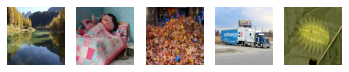

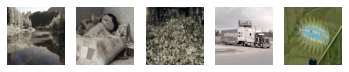

validation Output: 


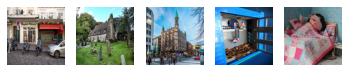

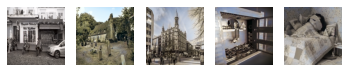


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1000.pth.
Train Epoch: 1001 [0/256 (0%)]	UNetLoss: 0.078229
Train Epoch: 1002 [0/256 (0%)]	UNetLoss: 0.086311
Train Epoch: 1003 [0/256 (0%)]	UNetLoss: 0.089798
Train Epoch: 1004 [0/256 (0%)]	UNetLoss: 0.085066
Train Epoch: 1005 [0/256 (0%)]	UNetLoss: 0.091072
Train Epoch: 1006 [0/256 (0%)]	UNetLoss: 0.098868
Train Epoch: 1007 [0/256 (0%)]	UNetLoss: 0.074268
Train Epoch: 1008 [0/256 (0%)]	UNetLoss: 0.079319
Train Epoch: 1009 [0/256 (0%)]	UNetLoss: 0.085955
Train Epoch: 1010 [0/256 (0%)]	UNetLoss: 0.088446
Train Epoch: 1011 [0/256 (0%)]	UNetLoss: 0.078284
Train Epoch: 1012 [0/256 (0%)]	UNetLoss: 0.086081
Train Epoch: 1013 [0/256 (0%)]	UNetLoss: 0.084649
Train Epoch: 1014 [0/256 (0%)]	UNetLoss: 0.094387
Train Epoch: 1015 [0/256 (0%)]	UNetLoss: 0.090899
Train Epoch: 1016 [0/256 (0%)]	UNetLoss: 0.086081
Train Epoch: 1017 [0/256 (0%)]	UNetLoss: 0.087098
Train Epoch: 1018 [0/256 (0%)]	UNetLoss: 0.102938
Train Epoch: 1019 

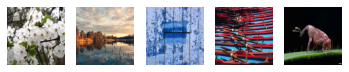

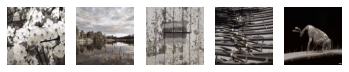

validation Output: 


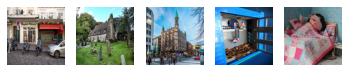

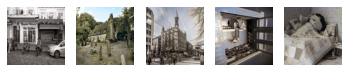


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1050.pth.
Train Epoch: 1051 [0/256 (0%)]	UNetLoss: 0.077497
Train Epoch: 1052 [0/256 (0%)]	UNetLoss: 0.084024
Train Epoch: 1053 [0/256 (0%)]	UNetLoss: 0.078247
Train Epoch: 1054 [0/256 (0%)]	UNetLoss: 0.093774
Train Epoch: 1055 [0/256 (0%)]	UNetLoss: 0.103724
Train Epoch: 1056 [0/256 (0%)]	UNetLoss: 0.092251
Train Epoch: 1057 [0/256 (0%)]	UNetLoss: 0.100561
Train Epoch: 1058 [0/256 (0%)]	UNetLoss: 0.082120
Train Epoch: 1059 [0/256 (0%)]	UNetLoss: 0.096527
Train Epoch: 1060 [0/256 (0%)]	UNetLoss: 0.084684
Train Epoch: 1061 [0/256 (0%)]	UNetLoss: 0.093205
Train Epoch: 1062 [0/256 (0%)]	UNetLoss: 0.081772
Train Epoch: 1063 [0/256 (0%)]	UNetLoss: 0.099088
Train Epoch: 1064 [0/256 (0%)]	UNetLoss: 0.090272
Train Epoch: 1065 [0/256 (0%)]	UNetLoss: 0.092852
Train Epoch: 1066 [0/256 (0%)]	UNetLoss: 0.082917
Train Epoch: 1067 [0/256 (0%)]	UNetLoss: 0.089713
Train Epoch: 1068 [0/256 (0%)]	UNetLoss: 0.081125
Train Epoch: 1069 

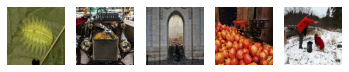

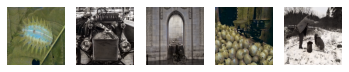

validation Output: 


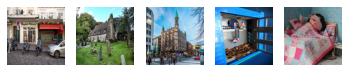

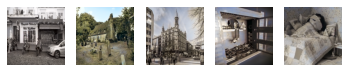


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1100.pth.
Train Epoch: 1101 [0/256 (0%)]	UNetLoss: 0.084163
Train Epoch: 1102 [0/256 (0%)]	UNetLoss: 0.083717
Train Epoch: 1103 [0/256 (0%)]	UNetLoss: 0.098885
Train Epoch: 1104 [0/256 (0%)]	UNetLoss: 0.085980
Train Epoch: 1105 [0/256 (0%)]	UNetLoss: 0.095041
Train Epoch: 1106 [0/256 (0%)]	UNetLoss: 0.088166
Train Epoch: 1107 [0/256 (0%)]	UNetLoss: 0.098316
Train Epoch: 1108 [0/256 (0%)]	UNetLoss: 0.102798
Train Epoch: 1109 [0/256 (0%)]	UNetLoss: 0.087517
Train Epoch: 1110 [0/256 (0%)]	UNetLoss: 0.088662
Train Epoch: 1111 [0/256 (0%)]	UNetLoss: 0.079029
Train Epoch: 1112 [0/256 (0%)]	UNetLoss: 0.080804
Train Epoch: 1113 [0/256 (0%)]	UNetLoss: 0.075051
Train Epoch: 1114 [0/256 (0%)]	UNetLoss: 0.074663
Train Epoch: 1115 [0/256 (0%)]	UNetLoss: 0.079333
Train Epoch: 1116 [0/256 (0%)]	UNetLoss: 0.089133
Train Epoch: 1117 [0/256 (0%)]	UNetLoss: 0.075209
Train Epoch: 1118 [0/256 (0%)]	UNetLoss: 0.075716
Train Epoch: 1119 

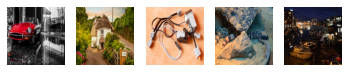

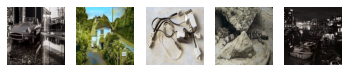

validation Output: 


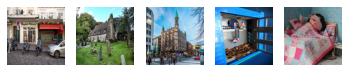

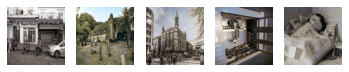


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1150.pth.
Train Epoch: 1151 [0/256 (0%)]	UNetLoss: 0.093964
Train Epoch: 1152 [0/256 (0%)]	UNetLoss: 0.072904
Train Epoch: 1153 [0/256 (0%)]	UNetLoss: 0.100355
Train Epoch: 1154 [0/256 (0%)]	UNetLoss: 0.091654
Train Epoch: 1155 [0/256 (0%)]	UNetLoss: 0.116674
Train Epoch: 1156 [0/256 (0%)]	UNetLoss: 0.067945
Train Epoch: 1157 [0/256 (0%)]	UNetLoss: 0.081052
Train Epoch: 1158 [0/256 (0%)]	UNetLoss: 0.083266
Train Epoch: 1159 [0/256 (0%)]	UNetLoss: 0.094855
Train Epoch: 1160 [0/256 (0%)]	UNetLoss: 0.100375
Train Epoch: 1161 [0/256 (0%)]	UNetLoss: 0.089351
Train Epoch: 1162 [0/256 (0%)]	UNetLoss: 0.090796
Train Epoch: 1163 [0/256 (0%)]	UNetLoss: 0.072709
Train Epoch: 1164 [0/256 (0%)]	UNetLoss: 0.080849
Train Epoch: 1165 [0/256 (0%)]	UNetLoss: 0.090049
Train Epoch: 1166 [0/256 (0%)]	UNetLoss: 0.079360
Train Epoch: 1167 [0/256 (0%)]	UNetLoss: 0.097327
Train Epoch: 1168 [0/256 (0%)]	UNetLoss: 0.084602
Train Epoch: 1169 

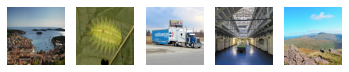

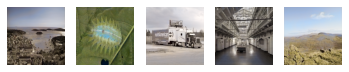

validation Output: 


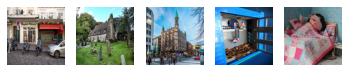

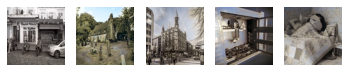


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1200.pth.
Train Epoch: 1201 [0/256 (0%)]	UNetLoss: 0.078722
Train Epoch: 1202 [0/256 (0%)]	UNetLoss: 0.084637
Train Epoch: 1203 [0/256 (0%)]	UNetLoss: 0.097176
Train Epoch: 1204 [0/256 (0%)]	UNetLoss: 0.091861
Train Epoch: 1205 [0/256 (0%)]	UNetLoss: 0.087385
Train Epoch: 1206 [0/256 (0%)]	UNetLoss: 0.080993
Train Epoch: 1207 [0/256 (0%)]	UNetLoss: 0.078185
Train Epoch: 1208 [0/256 (0%)]	UNetLoss: 0.097993
Train Epoch: 1209 [0/256 (0%)]	UNetLoss: 0.089531
Train Epoch: 1210 [0/256 (0%)]	UNetLoss: 0.091948
Train Epoch: 1211 [0/256 (0%)]	UNetLoss: 0.075298
Train Epoch: 1212 [0/256 (0%)]	UNetLoss: 0.107099
Train Epoch: 1213 [0/256 (0%)]	UNetLoss: 0.074418
Train Epoch: 1214 [0/256 (0%)]	UNetLoss: 0.085189
Train Epoch: 1215 [0/256 (0%)]	UNetLoss: 0.098741
Train Epoch: 1216 [0/256 (0%)]	UNetLoss: 0.087723
Train Epoch: 1217 [0/256 (0%)]	UNetLoss: 0.096571
Train Epoch: 1218 [0/256 (0%)]	UNetLoss: 0.085616
Train Epoch: 1219 

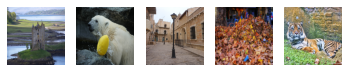

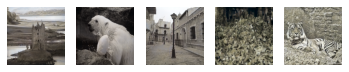

validation Output: 


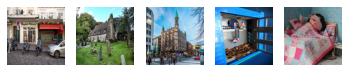

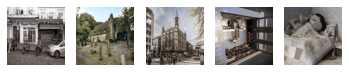


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1250.pth.
Train Epoch: 1251 [0/256 (0%)]	UNetLoss: 0.101644
Train Epoch: 1252 [0/256 (0%)]	UNetLoss: 0.086723
Train Epoch: 1253 [0/256 (0%)]	UNetLoss: 0.088031
Train Epoch: 1254 [0/256 (0%)]	UNetLoss: 0.081555
Train Epoch: 1255 [0/256 (0%)]	UNetLoss: 0.072999
Train Epoch: 1256 [0/256 (0%)]	UNetLoss: 0.088660
Train Epoch: 1257 [0/256 (0%)]	UNetLoss: 0.091115
Train Epoch: 1258 [0/256 (0%)]	UNetLoss: 0.076892
Train Epoch: 1259 [0/256 (0%)]	UNetLoss: 0.074039
Train Epoch: 1260 [0/256 (0%)]	UNetLoss: 0.102612
Train Epoch: 1261 [0/256 (0%)]	UNetLoss: 0.081741
Train Epoch: 1262 [0/256 (0%)]	UNetLoss: 0.073138
Train Epoch: 1263 [0/256 (0%)]	UNetLoss: 0.088879
Train Epoch: 1264 [0/256 (0%)]	UNetLoss: 0.089429
Train Epoch: 1265 [0/256 (0%)]	UNetLoss: 0.104437
Train Epoch: 1266 [0/256 (0%)]	UNetLoss: 0.087970
Train Epoch: 1267 [0/256 (0%)]	UNetLoss: 0.090571
Train Epoch: 1268 [0/256 (0%)]	UNetLoss: 0.083927
Train Epoch: 1269 

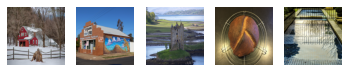

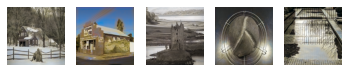

validation Output: 


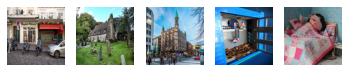

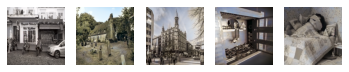


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1300.pth.
Train Epoch: 1301 [0/256 (0%)]	UNetLoss: 0.083121
Train Epoch: 1302 [0/256 (0%)]	UNetLoss: 0.091578
Train Epoch: 1303 [0/256 (0%)]	UNetLoss: 0.082608
Train Epoch: 1304 [0/256 (0%)]	UNetLoss: 0.088641
Train Epoch: 1305 [0/256 (0%)]	UNetLoss: 0.083597
Train Epoch: 1306 [0/256 (0%)]	UNetLoss: 0.095590
Train Epoch: 1307 [0/256 (0%)]	UNetLoss: 0.112328
Train Epoch: 1308 [0/256 (0%)]	UNetLoss: 0.092348
Train Epoch: 1309 [0/256 (0%)]	UNetLoss: 0.095263
Train Epoch: 1310 [0/256 (0%)]	UNetLoss: 0.088866
Train Epoch: 1311 [0/256 (0%)]	UNetLoss: 0.093387
Train Epoch: 1312 [0/256 (0%)]	UNetLoss: 0.075905
Train Epoch: 1313 [0/256 (0%)]	UNetLoss: 0.095143
Train Epoch: 1314 [0/256 (0%)]	UNetLoss: 0.070493
Train Epoch: 1315 [0/256 (0%)]	UNetLoss: 0.083231
Train Epoch: 1316 [0/256 (0%)]	UNetLoss: 0.098350
Train Epoch: 1317 [0/256 (0%)]	UNetLoss: 0.072771
Train Epoch: 1318 [0/256 (0%)]	UNetLoss: 0.090543
Train Epoch: 1319 

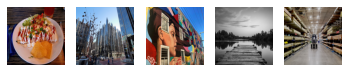

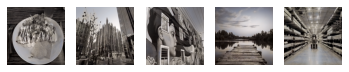

validation Output: 


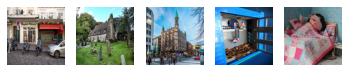

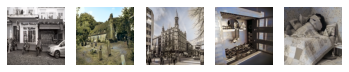


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1350.pth.
Train Epoch: 1351 [0/256 (0%)]	UNetLoss: 0.094138
Train Epoch: 1352 [0/256 (0%)]	UNetLoss: 0.093178
Train Epoch: 1353 [0/256 (0%)]	UNetLoss: 0.084937
Train Epoch: 1354 [0/256 (0%)]	UNetLoss: 0.077799
Train Epoch: 1355 [0/256 (0%)]	UNetLoss: 0.087749
Train Epoch: 1356 [0/256 (0%)]	UNetLoss: 0.091679
Train Epoch: 1357 [0/256 (0%)]	UNetLoss: 0.088304
Train Epoch: 1358 [0/256 (0%)]	UNetLoss: 0.085785
Train Epoch: 1359 [0/256 (0%)]	UNetLoss: 0.086397
Train Epoch: 1360 [0/256 (0%)]	UNetLoss: 0.079550
Train Epoch: 1361 [0/256 (0%)]	UNetLoss: 0.082972
Train Epoch: 1362 [0/256 (0%)]	UNetLoss: 0.100835
Train Epoch: 1363 [0/256 (0%)]	UNetLoss: 0.073800
Train Epoch: 1364 [0/256 (0%)]	UNetLoss: 0.102845
Train Epoch: 1365 [0/256 (0%)]	UNetLoss: 0.079913
Train Epoch: 1366 [0/256 (0%)]	UNetLoss: 0.084775
Train Epoch: 1367 [0/256 (0%)]	UNetLoss: 0.097258
Train Epoch: 1368 [0/256 (0%)]	UNetLoss: 0.091281
Train Epoch: 1369 

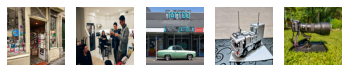

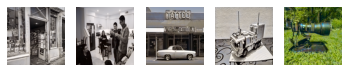

validation Output: 


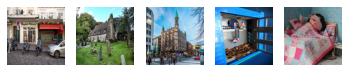

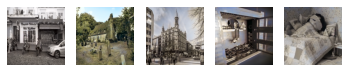


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1400.pth.
Train Epoch: 1401 [0/256 (0%)]	UNetLoss: 0.093454
Train Epoch: 1402 [0/256 (0%)]	UNetLoss: 0.080495
Train Epoch: 1403 [0/256 (0%)]	UNetLoss: 0.090460
Train Epoch: 1404 [0/256 (0%)]	UNetLoss: 0.093267
Train Epoch: 1405 [0/256 (0%)]	UNetLoss: 0.082734
Train Epoch: 1406 [0/256 (0%)]	UNetLoss: 0.089759
Train Epoch: 1407 [0/256 (0%)]	UNetLoss: 0.085891
Train Epoch: 1408 [0/256 (0%)]	UNetLoss: 0.088114
Train Epoch: 1409 [0/256 (0%)]	UNetLoss: 0.094352
Train Epoch: 1410 [0/256 (0%)]	UNetLoss: 0.077908
Train Epoch: 1411 [0/256 (0%)]	UNetLoss: 0.100419
Train Epoch: 1412 [0/256 (0%)]	UNetLoss: 0.091587
Train Epoch: 1413 [0/256 (0%)]	UNetLoss: 0.096885
Train Epoch: 1414 [0/256 (0%)]	UNetLoss: 0.082444
Train Epoch: 1415 [0/256 (0%)]	UNetLoss: 0.087953
Train Epoch: 1416 [0/256 (0%)]	UNetLoss: 0.088047
Train Epoch: 1417 [0/256 (0%)]	UNetLoss: 0.081763
Train Epoch: 1418 [0/256 (0%)]	UNetLoss: 0.064588
Train Epoch: 1419 

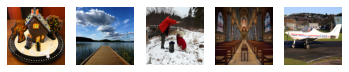

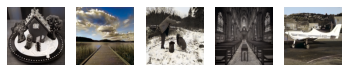

validation Output: 


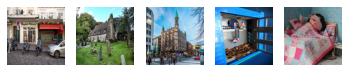

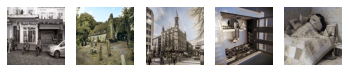


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1450.pth.
Train Epoch: 1451 [0/256 (0%)]	UNetLoss: 0.079852
Train Epoch: 1452 [0/256 (0%)]	UNetLoss: 0.088642
Train Epoch: 1453 [0/256 (0%)]	UNetLoss: 0.107070
Train Epoch: 1454 [0/256 (0%)]	UNetLoss: 0.089577
Train Epoch: 1455 [0/256 (0%)]	UNetLoss: 0.078019
Train Epoch: 1456 [0/256 (0%)]	UNetLoss: 0.085320
Train Epoch: 1457 [0/256 (0%)]	UNetLoss: 0.104259
Train Epoch: 1458 [0/256 (0%)]	UNetLoss: 0.090095
Train Epoch: 1459 [0/256 (0%)]	UNetLoss: 0.078965
Train Epoch: 1460 [0/256 (0%)]	UNetLoss: 0.079350
Train Epoch: 1461 [0/256 (0%)]	UNetLoss: 0.079378
Train Epoch: 1462 [0/256 (0%)]	UNetLoss: 0.084600
Train Epoch: 1463 [0/256 (0%)]	UNetLoss: 0.075995
Train Epoch: 1464 [0/256 (0%)]	UNetLoss: 0.091712
Train Epoch: 1465 [0/256 (0%)]	UNetLoss: 0.088618
Train Epoch: 1466 [0/256 (0%)]	UNetLoss: 0.079838
Train Epoch: 1467 [0/256 (0%)]	UNetLoss: 0.093293
Train Epoch: 1468 [0/256 (0%)]	UNetLoss: 0.097821
Train Epoch: 1469 

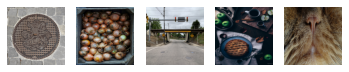

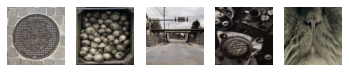

validation Output: 


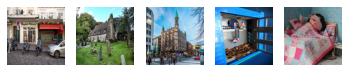

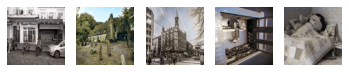


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1500.pth.
Train Epoch: 1501 [0/256 (0%)]	UNetLoss: 0.105841
Train Epoch: 1502 [0/256 (0%)]	UNetLoss: 0.103808
Train Epoch: 1503 [0/256 (0%)]	UNetLoss: 0.076347
Train Epoch: 1504 [0/256 (0%)]	UNetLoss: 0.095367
Train Epoch: 1505 [0/256 (0%)]	UNetLoss: 0.091785
Train Epoch: 1506 [0/256 (0%)]	UNetLoss: 0.081966
Train Epoch: 1507 [0/256 (0%)]	UNetLoss: 0.082121
Train Epoch: 1508 [0/256 (0%)]	UNetLoss: 0.077517
Train Epoch: 1509 [0/256 (0%)]	UNetLoss: 0.083271
Train Epoch: 1510 [0/256 (0%)]	UNetLoss: 0.091126
Train Epoch: 1511 [0/256 (0%)]	UNetLoss: 0.097298
Train Epoch: 1512 [0/256 (0%)]	UNetLoss: 0.084609
Train Epoch: 1513 [0/256 (0%)]	UNetLoss: 0.099570
Train Epoch: 1514 [0/256 (0%)]	UNetLoss: 0.069400
Train Epoch: 1515 [0/256 (0%)]	UNetLoss: 0.082527
Train Epoch: 1516 [0/256 (0%)]	UNetLoss: 0.101819
Train Epoch: 1517 [0/256 (0%)]	UNetLoss: 0.088782
Train Epoch: 1518 [0/256 (0%)]	UNetLoss: 0.102598
Train Epoch: 1519 

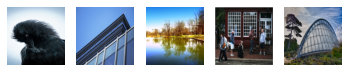

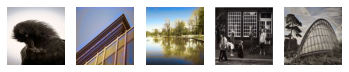

validation Output: 


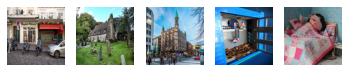

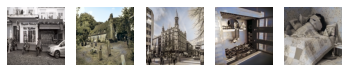


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1550.pth.
Train Epoch: 1551 [0/256 (0%)]	UNetLoss: 0.072649
Train Epoch: 1552 [0/256 (0%)]	UNetLoss: 0.070278
Train Epoch: 1553 [0/256 (0%)]	UNetLoss: 0.083533
Train Epoch: 1554 [0/256 (0%)]	UNetLoss: 0.081423
Train Epoch: 1555 [0/256 (0%)]	UNetLoss: 0.069496
Train Epoch: 1556 [0/256 (0%)]	UNetLoss: 0.093908
Train Epoch: 1557 [0/256 (0%)]	UNetLoss: 0.093188
Train Epoch: 1558 [0/256 (0%)]	UNetLoss: 0.087284
Train Epoch: 1559 [0/256 (0%)]	UNetLoss: 0.096512
Train Epoch: 1560 [0/256 (0%)]	UNetLoss: 0.083402
Train Epoch: 1561 [0/256 (0%)]	UNetLoss: 0.097689
Train Epoch: 1562 [0/256 (0%)]	UNetLoss: 0.095479
Train Epoch: 1563 [0/256 (0%)]	UNetLoss: 0.079958
Train Epoch: 1564 [0/256 (0%)]	UNetLoss: 0.089476
Train Epoch: 1565 [0/256 (0%)]	UNetLoss: 0.082903
Train Epoch: 1566 [0/256 (0%)]	UNetLoss: 0.088503
Train Epoch: 1567 [0/256 (0%)]	UNetLoss: 0.109226
Train Epoch: 1568 [0/256 (0%)]	UNetLoss: 0.092101
Train Epoch: 1569 

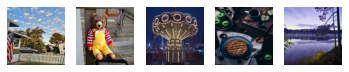

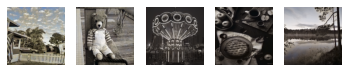

validation Output: 


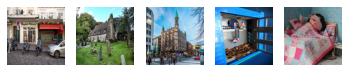

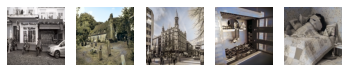


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1600.pth.
Train Epoch: 1601 [0/256 (0%)]	UNetLoss: 0.091459
Train Epoch: 1602 [0/256 (0%)]	UNetLoss: 0.089242
Train Epoch: 1603 [0/256 (0%)]	UNetLoss: 0.071560
Train Epoch: 1604 [0/256 (0%)]	UNetLoss: 0.079519
Train Epoch: 1605 [0/256 (0%)]	UNetLoss: 0.093381
Train Epoch: 1606 [0/256 (0%)]	UNetLoss: 0.089745
Train Epoch: 1607 [0/256 (0%)]	UNetLoss: 0.091264
Train Epoch: 1608 [0/256 (0%)]	UNetLoss: 0.093532
Train Epoch: 1609 [0/256 (0%)]	UNetLoss: 0.082691
Train Epoch: 1610 [0/256 (0%)]	UNetLoss: 0.107032
Train Epoch: 1611 [0/256 (0%)]	UNetLoss: 0.085238
Train Epoch: 1612 [0/256 (0%)]	UNetLoss: 0.089982
Train Epoch: 1613 [0/256 (0%)]	UNetLoss: 0.096995
Train Epoch: 1614 [0/256 (0%)]	UNetLoss: 0.103880
Train Epoch: 1615 [0/256 (0%)]	UNetLoss: 0.085841
Train Epoch: 1616 [0/256 (0%)]	UNetLoss: 0.094460
Train Epoch: 1617 [0/256 (0%)]	UNetLoss: 0.113317
Train Epoch: 1618 [0/256 (0%)]	UNetLoss: 0.098075
Train Epoch: 1619 

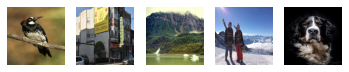

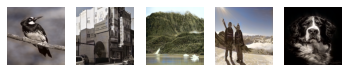

validation Output: 


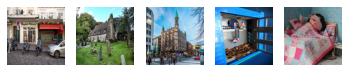

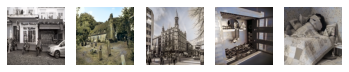


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1650.pth.
Train Epoch: 1651 [0/256 (0%)]	UNetLoss: 0.072257
Train Epoch: 1652 [0/256 (0%)]	UNetLoss: 0.092490
Train Epoch: 1653 [0/256 (0%)]	UNetLoss: 0.082538
Train Epoch: 1654 [0/256 (0%)]	UNetLoss: 0.093953
Train Epoch: 1655 [0/256 (0%)]	UNetLoss: 0.088765
Train Epoch: 1656 [0/256 (0%)]	UNetLoss: 0.084931
Train Epoch: 1657 [0/256 (0%)]	UNetLoss: 0.090031
Train Epoch: 1658 [0/256 (0%)]	UNetLoss: 0.095649
Train Epoch: 1659 [0/256 (0%)]	UNetLoss: 0.086811
Train Epoch: 1660 [0/256 (0%)]	UNetLoss: 0.088065
Train Epoch: 1661 [0/256 (0%)]	UNetLoss: 0.087524
Train Epoch: 1662 [0/256 (0%)]	UNetLoss: 0.080404
Train Epoch: 1663 [0/256 (0%)]	UNetLoss: 0.081947
Train Epoch: 1664 [0/256 (0%)]	UNetLoss: 0.081833
Train Epoch: 1665 [0/256 (0%)]	UNetLoss: 0.077821
Train Epoch: 1666 [0/256 (0%)]	UNetLoss: 0.080531
Train Epoch: 1667 [0/256 (0%)]	UNetLoss: 0.088335
Train Epoch: 1668 [0/256 (0%)]	UNetLoss: 0.086306
Train Epoch: 1669 

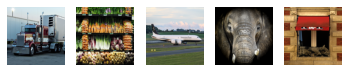

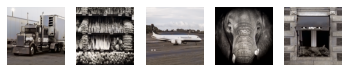

validation Output: 


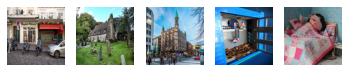

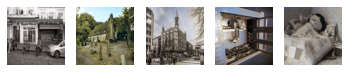


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1700.pth.
Train Epoch: 1701 [0/256 (0%)]	UNetLoss: 0.101504
Train Epoch: 1702 [0/256 (0%)]	UNetLoss: 0.084046
Train Epoch: 1703 [0/256 (0%)]	UNetLoss: 0.078379
Train Epoch: 1704 [0/256 (0%)]	UNetLoss: 0.085327
Train Epoch: 1705 [0/256 (0%)]	UNetLoss: 0.084333
Train Epoch: 1706 [0/256 (0%)]	UNetLoss: 0.086562
Train Epoch: 1707 [0/256 (0%)]	UNetLoss: 0.086890
Train Epoch: 1708 [0/256 (0%)]	UNetLoss: 0.098102
Train Epoch: 1709 [0/256 (0%)]	UNetLoss: 0.087833
Train Epoch: 1710 [0/256 (0%)]	UNetLoss: 0.099426
Train Epoch: 1711 [0/256 (0%)]	UNetLoss: 0.081832
Train Epoch: 1712 [0/256 (0%)]	UNetLoss: 0.103219
Train Epoch: 1713 [0/256 (0%)]	UNetLoss: 0.089658
Train Epoch: 1714 [0/256 (0%)]	UNetLoss: 0.085523
Train Epoch: 1715 [0/256 (0%)]	UNetLoss: 0.105669
Train Epoch: 1716 [0/256 (0%)]	UNetLoss: 0.088481
Train Epoch: 1717 [0/256 (0%)]	UNetLoss: 0.082112
Train Epoch: 1718 [0/256 (0%)]	UNetLoss: 0.079106
Train Epoch: 1719 

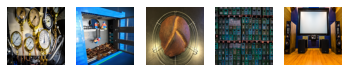

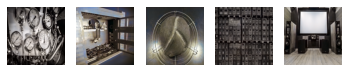

validation Output: 


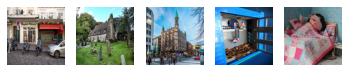

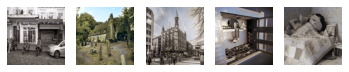


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1750.pth.
Train Epoch: 1751 [0/256 (0%)]	UNetLoss: 0.088740
Train Epoch: 1752 [0/256 (0%)]	UNetLoss: 0.096107
Train Epoch: 1753 [0/256 (0%)]	UNetLoss: 0.073504
Train Epoch: 1754 [0/256 (0%)]	UNetLoss: 0.079504
Train Epoch: 1755 [0/256 (0%)]	UNetLoss: 0.079193
Train Epoch: 1756 [0/256 (0%)]	UNetLoss: 0.095092
Train Epoch: 1757 [0/256 (0%)]	UNetLoss: 0.080987
Train Epoch: 1758 [0/256 (0%)]	UNetLoss: 0.082820
Train Epoch: 1759 [0/256 (0%)]	UNetLoss: 0.086883
Train Epoch: 1760 [0/256 (0%)]	UNetLoss: 0.074110
Train Epoch: 1761 [0/256 (0%)]	UNetLoss: 0.090678
Train Epoch: 1762 [0/256 (0%)]	UNetLoss: 0.084521
Train Epoch: 1763 [0/256 (0%)]	UNetLoss: 0.093938
Train Epoch: 1764 [0/256 (0%)]	UNetLoss: 0.086744
Train Epoch: 1765 [0/256 (0%)]	UNetLoss: 0.104813
Train Epoch: 1766 [0/256 (0%)]	UNetLoss: 0.094477
Train Epoch: 1767 [0/256 (0%)]	UNetLoss: 0.081303
Train Epoch: 1768 [0/256 (0%)]	UNetLoss: 0.097628
Train Epoch: 1769 

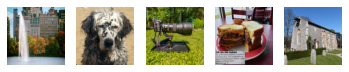

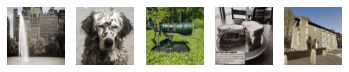

validation Output: 


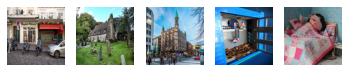

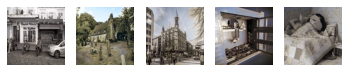


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1800.pth.
Train Epoch: 1801 [0/256 (0%)]	UNetLoss: 0.086286
Train Epoch: 1802 [0/256 (0%)]	UNetLoss: 0.098497
Train Epoch: 1803 [0/256 (0%)]	UNetLoss: 0.085783
Train Epoch: 1804 [0/256 (0%)]	UNetLoss: 0.086486
Train Epoch: 1805 [0/256 (0%)]	UNetLoss: 0.094598
Train Epoch: 1806 [0/256 (0%)]	UNetLoss: 0.095394
Train Epoch: 1807 [0/256 (0%)]	UNetLoss: 0.090672
Train Epoch: 1808 [0/256 (0%)]	UNetLoss: 0.085373
Train Epoch: 1809 [0/256 (0%)]	UNetLoss: 0.080172
Train Epoch: 1810 [0/256 (0%)]	UNetLoss: 0.102729
Train Epoch: 1811 [0/256 (0%)]	UNetLoss: 0.093729
Train Epoch: 1812 [0/256 (0%)]	UNetLoss: 0.093029
Train Epoch: 1813 [0/256 (0%)]	UNetLoss: 0.085886
Train Epoch: 1814 [0/256 (0%)]	UNetLoss: 0.091686
Train Epoch: 1815 [0/256 (0%)]	UNetLoss: 0.083445
Train Epoch: 1816 [0/256 (0%)]	UNetLoss: 0.092444
Train Epoch: 1817 [0/256 (0%)]	UNetLoss: 0.083539
Train Epoch: 1818 [0/256 (0%)]	UNetLoss: 0.091977
Train Epoch: 1819 

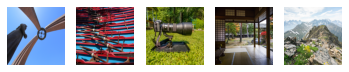

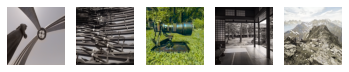

validation Output: 


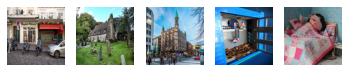

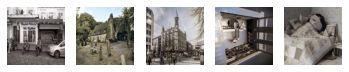


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1850.pth.
Train Epoch: 1851 [0/256 (0%)]	UNetLoss: 0.081325
Train Epoch: 1852 [0/256 (0%)]	UNetLoss: 0.088425
Train Epoch: 1853 [0/256 (0%)]	UNetLoss: 0.099065
Train Epoch: 1854 [0/256 (0%)]	UNetLoss: 0.079758
Train Epoch: 1855 [0/256 (0%)]	UNetLoss: 0.092858
Train Epoch: 1856 [0/256 (0%)]	UNetLoss: 0.077511
Train Epoch: 1857 [0/256 (0%)]	UNetLoss: 0.079100
Train Epoch: 1858 [0/256 (0%)]	UNetLoss: 0.073699
Train Epoch: 1859 [0/256 (0%)]	UNetLoss: 0.082698
Train Epoch: 1860 [0/256 (0%)]	UNetLoss: 0.086299
Train Epoch: 1861 [0/256 (0%)]	UNetLoss: 0.085010
Train Epoch: 1862 [0/256 (0%)]	UNetLoss: 0.089559
Train Epoch: 1863 [0/256 (0%)]	UNetLoss: 0.086562
Train Epoch: 1864 [0/256 (0%)]	UNetLoss: 0.084891
Train Epoch: 1865 [0/256 (0%)]	UNetLoss: 0.096083
Train Epoch: 1866 [0/256 (0%)]	UNetLoss: 0.088101
Train Epoch: 1867 [0/256 (0%)]	UNetLoss: 0.092514
Train Epoch: 1868 [0/256 (0%)]	UNetLoss: 0.106194
Train Epoch: 1869 

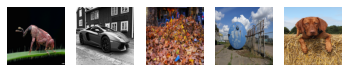

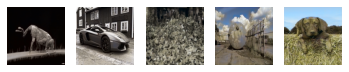

validation Output: 


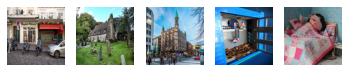

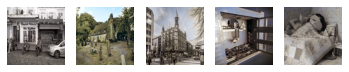


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1900.pth.
Train Epoch: 1901 [0/256 (0%)]	UNetLoss: 0.085309
Train Epoch: 1902 [0/256 (0%)]	UNetLoss: 0.095874
Train Epoch: 1903 [0/256 (0%)]	UNetLoss: 0.070002
Train Epoch: 1904 [0/256 (0%)]	UNetLoss: 0.090438
Train Epoch: 1905 [0/256 (0%)]	UNetLoss: 0.084508
Train Epoch: 1906 [0/256 (0%)]	UNetLoss: 0.085221
Train Epoch: 1907 [0/256 (0%)]	UNetLoss: 0.085086
Train Epoch: 1908 [0/256 (0%)]	UNetLoss: 0.099671
Train Epoch: 1909 [0/256 (0%)]	UNetLoss: 0.086874
Train Epoch: 1910 [0/256 (0%)]	UNetLoss: 0.093331
Train Epoch: 1911 [0/256 (0%)]	UNetLoss: 0.084743
Train Epoch: 1912 [0/256 (0%)]	UNetLoss: 0.081770
Train Epoch: 1913 [0/256 (0%)]	UNetLoss: 0.091341
Train Epoch: 1914 [0/256 (0%)]	UNetLoss: 0.088460
Train Epoch: 1915 [0/256 (0%)]	UNetLoss: 0.100532
Train Epoch: 1916 [0/256 (0%)]	UNetLoss: 0.089739
Train Epoch: 1917 [0/256 (0%)]	UNetLoss: 0.081598
Train Epoch: 1918 [0/256 (0%)]	UNetLoss: 0.089380
Train Epoch: 1919 

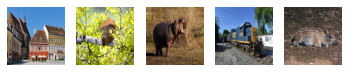

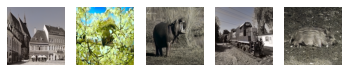

validation Output: 


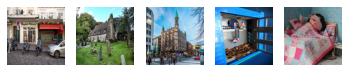

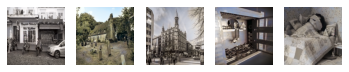


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_1950.pth.
Train Epoch: 1951 [0/256 (0%)]	UNetLoss: 0.083304
Train Epoch: 1952 [0/256 (0%)]	UNetLoss: 0.075692
Train Epoch: 1953 [0/256 (0%)]	UNetLoss: 0.091772
Train Epoch: 1954 [0/256 (0%)]	UNetLoss: 0.084410
Train Epoch: 1955 [0/256 (0%)]	UNetLoss: 0.081273
Train Epoch: 1956 [0/256 (0%)]	UNetLoss: 0.090127
Train Epoch: 1957 [0/256 (0%)]	UNetLoss: 0.102825
Train Epoch: 1958 [0/256 (0%)]	UNetLoss: 0.090994
Train Epoch: 1959 [0/256 (0%)]	UNetLoss: 0.080654
Train Epoch: 1960 [0/256 (0%)]	UNetLoss: 0.090317
Train Epoch: 1961 [0/256 (0%)]	UNetLoss: 0.089574
Train Epoch: 1962 [0/256 (0%)]	UNetLoss: 0.081027
Train Epoch: 1963 [0/256 (0%)]	UNetLoss: 0.101329
Train Epoch: 1964 [0/256 (0%)]	UNetLoss: 0.090060
Train Epoch: 1965 [0/256 (0%)]	UNetLoss: 0.089700
Train Epoch: 1966 [0/256 (0%)]	UNetLoss: 0.084616
Train Epoch: 1967 [0/256 (0%)]	UNetLoss: 0.077845
Train Epoch: 1968 [0/256 (0%)]	UNetLoss: 0.090101
Train Epoch: 1969 

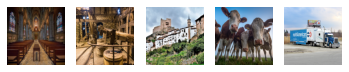

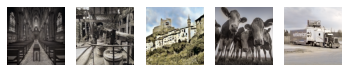

validation Output: 


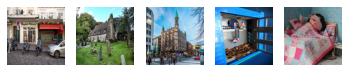

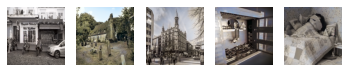


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2000.pth.
Train Epoch: 2001 [0/256 (0%)]	UNetLoss: 0.088414
Train Epoch: 2002 [0/256 (0%)]	UNetLoss: 0.089087
Train Epoch: 2003 [0/256 (0%)]	UNetLoss: 0.097039
Train Epoch: 2004 [0/256 (0%)]	UNetLoss: 0.100317
Train Epoch: 2005 [0/256 (0%)]	UNetLoss: 0.083347
Train Epoch: 2006 [0/256 (0%)]	UNetLoss: 0.094554
Train Epoch: 2007 [0/256 (0%)]	UNetLoss: 0.073148
Train Epoch: 2008 [0/256 (0%)]	UNetLoss: 0.078547
Train Epoch: 2009 [0/256 (0%)]	UNetLoss: 0.086691
Train Epoch: 2010 [0/256 (0%)]	UNetLoss: 0.124227
Train Epoch: 2011 [0/256 (0%)]	UNetLoss: 0.086643
Train Epoch: 2012 [0/256 (0%)]	UNetLoss: 0.073311
Train Epoch: 2013 [0/256 (0%)]	UNetLoss: 0.076138
Train Epoch: 2014 [0/256 (0%)]	UNetLoss: 0.078291
Train Epoch: 2015 [0/256 (0%)]	UNetLoss: 0.084987
Train Epoch: 2016 [0/256 (0%)]	UNetLoss: 0.094361
Train Epoch: 2017 [0/256 (0%)]	UNetLoss: 0.083778
Train Epoch: 2018 [0/256 (0%)]	UNetLoss: 0.079529
Train Epoch: 2019 

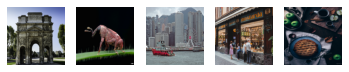

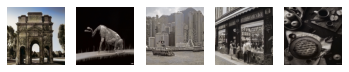

validation Output: 


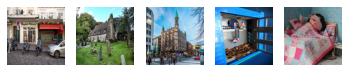

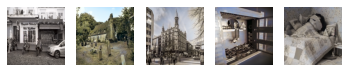


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2050.pth.
Train Epoch: 2051 [0/256 (0%)]	UNetLoss: 0.085038
Train Epoch: 2052 [0/256 (0%)]	UNetLoss: 0.079056
Train Epoch: 2053 [0/256 (0%)]	UNetLoss: 0.076273
Train Epoch: 2054 [0/256 (0%)]	UNetLoss: 0.096138
Train Epoch: 2055 [0/256 (0%)]	UNetLoss: 0.084418
Train Epoch: 2056 [0/256 (0%)]	UNetLoss: 0.080737
Train Epoch: 2057 [0/256 (0%)]	UNetLoss: 0.081712
Train Epoch: 2058 [0/256 (0%)]	UNetLoss: 0.087787
Train Epoch: 2059 [0/256 (0%)]	UNetLoss: 0.093027
Train Epoch: 2060 [0/256 (0%)]	UNetLoss: 0.092931
Train Epoch: 2061 [0/256 (0%)]	UNetLoss: 0.082855
Train Epoch: 2062 [0/256 (0%)]	UNetLoss: 0.094639
Train Epoch: 2063 [0/256 (0%)]	UNetLoss: 0.067025
Train Epoch: 2064 [0/256 (0%)]	UNetLoss: 0.090800
Train Epoch: 2065 [0/256 (0%)]	UNetLoss: 0.082102
Train Epoch: 2066 [0/256 (0%)]	UNetLoss: 0.078056
Train Epoch: 2067 [0/256 (0%)]	UNetLoss: 0.075544
Train Epoch: 2068 [0/256 (0%)]	UNetLoss: 0.086671
Train Epoch: 2069 

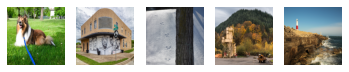

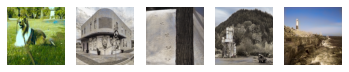

validation Output: 


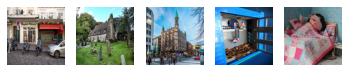

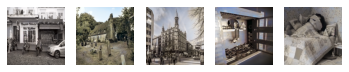


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2100.pth.
Train Epoch: 2101 [0/256 (0%)]	UNetLoss: 0.081365
Train Epoch: 2102 [0/256 (0%)]	UNetLoss: 0.100202
Train Epoch: 2103 [0/256 (0%)]	UNetLoss: 0.080654
Train Epoch: 2104 [0/256 (0%)]	UNetLoss: 0.084220
Train Epoch: 2105 [0/256 (0%)]	UNetLoss: 0.088775
Train Epoch: 2106 [0/256 (0%)]	UNetLoss: 0.084980
Train Epoch: 2107 [0/256 (0%)]	UNetLoss: 0.088342
Train Epoch: 2108 [0/256 (0%)]	UNetLoss: 0.089435
Train Epoch: 2109 [0/256 (0%)]	UNetLoss: 0.084326
Train Epoch: 2110 [0/256 (0%)]	UNetLoss: 0.081277
Train Epoch: 2111 [0/256 (0%)]	UNetLoss: 0.084575
Train Epoch: 2112 [0/256 (0%)]	UNetLoss: 0.089552
Train Epoch: 2113 [0/256 (0%)]	UNetLoss: 0.079857
Train Epoch: 2114 [0/256 (0%)]	UNetLoss: 0.102229
Train Epoch: 2115 [0/256 (0%)]	UNetLoss: 0.096538
Train Epoch: 2116 [0/256 (0%)]	UNetLoss: 0.090301
Train Epoch: 2117 [0/256 (0%)]	UNetLoss: 0.082712
Train Epoch: 2118 [0/256 (0%)]	UNetLoss: 0.090030
Train Epoch: 2119 

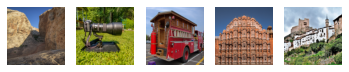

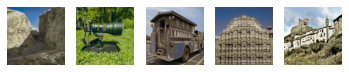

validation Output: 


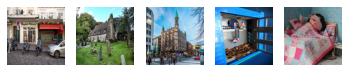

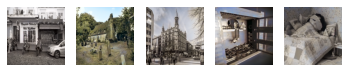


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2150.pth.
Train Epoch: 2151 [0/256 (0%)]	UNetLoss: 0.099511
Train Epoch: 2152 [0/256 (0%)]	UNetLoss: 0.098193
Train Epoch: 2153 [0/256 (0%)]	UNetLoss: 0.078657
Train Epoch: 2154 [0/256 (0%)]	UNetLoss: 0.086392
Train Epoch: 2155 [0/256 (0%)]	UNetLoss: 0.097139
Train Epoch: 2156 [0/256 (0%)]	UNetLoss: 0.087699
Train Epoch: 2157 [0/256 (0%)]	UNetLoss: 0.090143
Train Epoch: 2158 [0/256 (0%)]	UNetLoss: 0.095142
Train Epoch: 2159 [0/256 (0%)]	UNetLoss: 0.085510
Train Epoch: 2160 [0/256 (0%)]	UNetLoss: 0.083596
Train Epoch: 2161 [0/256 (0%)]	UNetLoss: 0.094568
Train Epoch: 2162 [0/256 (0%)]	UNetLoss: 0.090351
Train Epoch: 2163 [0/256 (0%)]	UNetLoss: 0.093678
Train Epoch: 2164 [0/256 (0%)]	UNetLoss: 0.100918
Train Epoch: 2165 [0/256 (0%)]	UNetLoss: 0.087692
Train Epoch: 2166 [0/256 (0%)]	UNetLoss: 0.074752
Train Epoch: 2167 [0/256 (0%)]	UNetLoss: 0.084705
Train Epoch: 2168 [0/256 (0%)]	UNetLoss: 0.094655
Train Epoch: 2169 

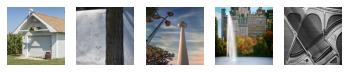

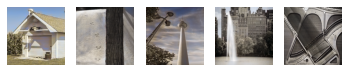

validation Output: 


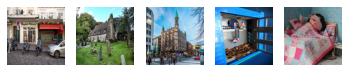

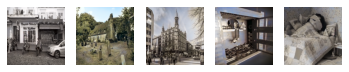


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2200.pth.
Train Epoch: 2201 [0/256 (0%)]	UNetLoss: 0.093027
Train Epoch: 2202 [0/256 (0%)]	UNetLoss: 0.085775
Train Epoch: 2203 [0/256 (0%)]	UNetLoss: 0.082066
Train Epoch: 2204 [0/256 (0%)]	UNetLoss: 0.093115
Train Epoch: 2205 [0/256 (0%)]	UNetLoss: 0.079605
Train Epoch: 2206 [0/256 (0%)]	UNetLoss: 0.098985
Train Epoch: 2207 [0/256 (0%)]	UNetLoss: 0.098794
Train Epoch: 2208 [0/256 (0%)]	UNetLoss: 0.083308
Train Epoch: 2209 [0/256 (0%)]	UNetLoss: 0.083550
Train Epoch: 2210 [0/256 (0%)]	UNetLoss: 0.111023
Train Epoch: 2211 [0/256 (0%)]	UNetLoss: 0.095257
Train Epoch: 2212 [0/256 (0%)]	UNetLoss: 0.086494
Train Epoch: 2213 [0/256 (0%)]	UNetLoss: 0.083083
Train Epoch: 2214 [0/256 (0%)]	UNetLoss: 0.075565
Train Epoch: 2215 [0/256 (0%)]	UNetLoss: 0.092992
Train Epoch: 2216 [0/256 (0%)]	UNetLoss: 0.088700
Train Epoch: 2217 [0/256 (0%)]	UNetLoss: 0.088404
Train Epoch: 2218 [0/256 (0%)]	UNetLoss: 0.092444
Train Epoch: 2219 

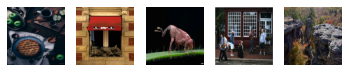

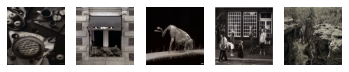

validation Output: 


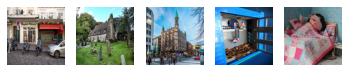

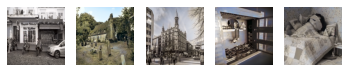


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2250.pth.
Train Epoch: 2251 [0/256 (0%)]	UNetLoss: 0.092228
Train Epoch: 2252 [0/256 (0%)]	UNetLoss: 0.085008
Train Epoch: 2253 [0/256 (0%)]	UNetLoss: 0.080140
Train Epoch: 2254 [0/256 (0%)]	UNetLoss: 0.081295
Train Epoch: 2255 [0/256 (0%)]	UNetLoss: 0.096951
Train Epoch: 2256 [0/256 (0%)]	UNetLoss: 0.090447
Train Epoch: 2257 [0/256 (0%)]	UNetLoss: 0.102006
Train Epoch: 2258 [0/256 (0%)]	UNetLoss: 0.094665
Train Epoch: 2259 [0/256 (0%)]	UNetLoss: 0.076410
Train Epoch: 2260 [0/256 (0%)]	UNetLoss: 0.079911
Train Epoch: 2261 [0/256 (0%)]	UNetLoss: 0.080408
Train Epoch: 2262 [0/256 (0%)]	UNetLoss: 0.091715
Train Epoch: 2263 [0/256 (0%)]	UNetLoss: 0.085428
Train Epoch: 2264 [0/256 (0%)]	UNetLoss: 0.080137
Train Epoch: 2265 [0/256 (0%)]	UNetLoss: 0.098731
Train Epoch: 2266 [0/256 (0%)]	UNetLoss: 0.107365
Train Epoch: 2267 [0/256 (0%)]	UNetLoss: 0.102924
Train Epoch: 2268 [0/256 (0%)]	UNetLoss: 0.093348
Train Epoch: 2269 

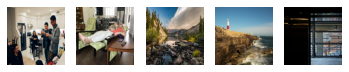

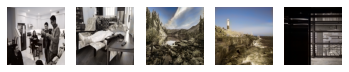

validation Output: 


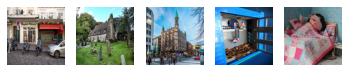

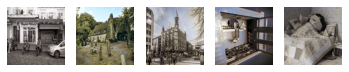


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2300.pth.
Train Epoch: 2301 [0/256 (0%)]	UNetLoss: 0.087894
Train Epoch: 2302 [0/256 (0%)]	UNetLoss: 0.080039
Train Epoch: 2303 [0/256 (0%)]	UNetLoss: 0.102139
Train Epoch: 2304 [0/256 (0%)]	UNetLoss: 0.088293
Train Epoch: 2305 [0/256 (0%)]	UNetLoss: 0.081249
Train Epoch: 2306 [0/256 (0%)]	UNetLoss: 0.085560
Train Epoch: 2307 [0/256 (0%)]	UNetLoss: 0.102656
Train Epoch: 2308 [0/256 (0%)]	UNetLoss: 0.087167
Train Epoch: 2309 [0/256 (0%)]	UNetLoss: 0.083724
Train Epoch: 2310 [0/256 (0%)]	UNetLoss: 0.092129
Train Epoch: 2311 [0/256 (0%)]	UNetLoss: 0.084515
Train Epoch: 2312 [0/256 (0%)]	UNetLoss: 0.097139
Train Epoch: 2313 [0/256 (0%)]	UNetLoss: 0.098421
Train Epoch: 2314 [0/256 (0%)]	UNetLoss: 0.083484
Train Epoch: 2315 [0/256 (0%)]	UNetLoss: 0.083092
Train Epoch: 2316 [0/256 (0%)]	UNetLoss: 0.082935
Train Epoch: 2317 [0/256 (0%)]	UNetLoss: 0.096981
Train Epoch: 2318 [0/256 (0%)]	UNetLoss: 0.089590
Train Epoch: 2319 

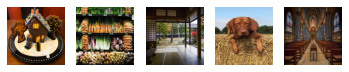

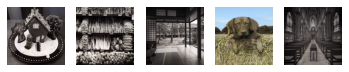

validation Output: 


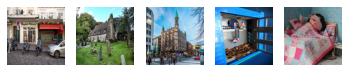

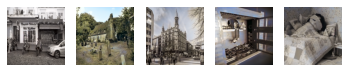


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2350.pth.
Train Epoch: 2351 [0/256 (0%)]	UNetLoss: 0.091561
Train Epoch: 2352 [0/256 (0%)]	UNetLoss: 0.092542
Train Epoch: 2353 [0/256 (0%)]	UNetLoss: 0.098620
Train Epoch: 2354 [0/256 (0%)]	UNetLoss: 0.084179
Train Epoch: 2355 [0/256 (0%)]	UNetLoss: 0.081897
Train Epoch: 2356 [0/256 (0%)]	UNetLoss: 0.095531
Train Epoch: 2357 [0/256 (0%)]	UNetLoss: 0.070281
Train Epoch: 2358 [0/256 (0%)]	UNetLoss: 0.106913
Train Epoch: 2359 [0/256 (0%)]	UNetLoss: 0.077503
Train Epoch: 2360 [0/256 (0%)]	UNetLoss: 0.072693
Train Epoch: 2361 [0/256 (0%)]	UNetLoss: 0.089508
Train Epoch: 2362 [0/256 (0%)]	UNetLoss: 0.079890
Train Epoch: 2363 [0/256 (0%)]	UNetLoss: 0.088344
Train Epoch: 2364 [0/256 (0%)]	UNetLoss: 0.089896
Train Epoch: 2365 [0/256 (0%)]	UNetLoss: 0.087071
Train Epoch: 2366 [0/256 (0%)]	UNetLoss: 0.085845
Train Epoch: 2367 [0/256 (0%)]	UNetLoss: 0.093008
Train Epoch: 2368 [0/256 (0%)]	UNetLoss: 0.082029
Train Epoch: 2369 

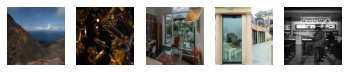

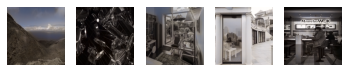

validation Output: 


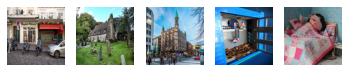

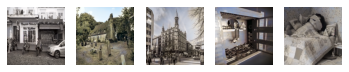


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2400.pth.
Train Epoch: 2401 [0/256 (0%)]	UNetLoss: 0.091417
Train Epoch: 2402 [0/256 (0%)]	UNetLoss: 0.095488
Train Epoch: 2403 [0/256 (0%)]	UNetLoss: 0.096227
Train Epoch: 2404 [0/256 (0%)]	UNetLoss: 0.077187
Train Epoch: 2405 [0/256 (0%)]	UNetLoss: 0.105400
Train Epoch: 2406 [0/256 (0%)]	UNetLoss: 0.080148
Train Epoch: 2407 [0/256 (0%)]	UNetLoss: 0.083554
Train Epoch: 2408 [0/256 (0%)]	UNetLoss: 0.086327
Train Epoch: 2409 [0/256 (0%)]	UNetLoss: 0.078788
Train Epoch: 2410 [0/256 (0%)]	UNetLoss: 0.076221
Train Epoch: 2411 [0/256 (0%)]	UNetLoss: 0.086102
Train Epoch: 2412 [0/256 (0%)]	UNetLoss: 0.078560
Train Epoch: 2413 [0/256 (0%)]	UNetLoss: 0.074952
Train Epoch: 2414 [0/256 (0%)]	UNetLoss: 0.080757
Train Epoch: 2415 [0/256 (0%)]	UNetLoss: 0.088895
Train Epoch: 2416 [0/256 (0%)]	UNetLoss: 0.081707
Train Epoch: 2417 [0/256 (0%)]	UNetLoss: 0.109458
Train Epoch: 2418 [0/256 (0%)]	UNetLoss: 0.070831
Train Epoch: 2419 

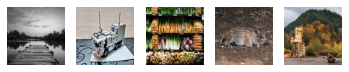

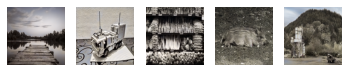

validation Output: 


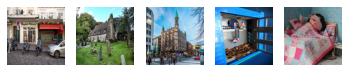

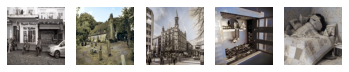


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2450.pth.
Train Epoch: 2451 [0/256 (0%)]	UNetLoss: 0.077791
Train Epoch: 2452 [0/256 (0%)]	UNetLoss: 0.075390
Train Epoch: 2453 [0/256 (0%)]	UNetLoss: 0.077430
Train Epoch: 2454 [0/256 (0%)]	UNetLoss: 0.088218
Train Epoch: 2455 [0/256 (0%)]	UNetLoss: 0.083282
Train Epoch: 2456 [0/256 (0%)]	UNetLoss: 0.067041
Train Epoch: 2457 [0/256 (0%)]	UNetLoss: 0.090631
Train Epoch: 2458 [0/256 (0%)]	UNetLoss: 0.081786
Train Epoch: 2459 [0/256 (0%)]	UNetLoss: 0.081353
Train Epoch: 2460 [0/256 (0%)]	UNetLoss: 0.076692
Train Epoch: 2461 [0/256 (0%)]	UNetLoss: 0.083364
Train Epoch: 2462 [0/256 (0%)]	UNetLoss: 0.083559
Train Epoch: 2463 [0/256 (0%)]	UNetLoss: 0.099075
Train Epoch: 2464 [0/256 (0%)]	UNetLoss: 0.080959
Train Epoch: 2465 [0/256 (0%)]	UNetLoss: 0.079842
Train Epoch: 2466 [0/256 (0%)]	UNetLoss: 0.085618
Train Epoch: 2467 [0/256 (0%)]	UNetLoss: 0.094051
Train Epoch: 2468 [0/256 (0%)]	UNetLoss: 0.074483
Train Epoch: 2469 

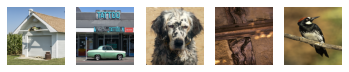

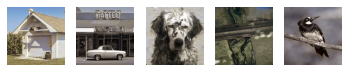

validation Output: 


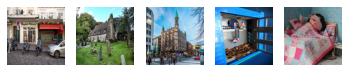

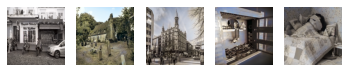


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2500.pth.
Train Epoch: 2501 [0/256 (0%)]	UNetLoss: 0.097521
Train Epoch: 2502 [0/256 (0%)]	UNetLoss: 0.088122
Train Epoch: 2503 [0/256 (0%)]	UNetLoss: 0.086997
Train Epoch: 2504 [0/256 (0%)]	UNetLoss: 0.085192
Train Epoch: 2505 [0/256 (0%)]	UNetLoss: 0.090851
Train Epoch: 2506 [0/256 (0%)]	UNetLoss: 0.082731
Train Epoch: 2507 [0/256 (0%)]	UNetLoss: 0.080668
Train Epoch: 2508 [0/256 (0%)]	UNetLoss: 0.081710
Train Epoch: 2509 [0/256 (0%)]	UNetLoss: 0.073244
Train Epoch: 2510 [0/256 (0%)]	UNetLoss: 0.090902
Train Epoch: 2511 [0/256 (0%)]	UNetLoss: 0.083013
Train Epoch: 2512 [0/256 (0%)]	UNetLoss: 0.106022
Train Epoch: 2513 [0/256 (0%)]	UNetLoss: 0.088728
Train Epoch: 2514 [0/256 (0%)]	UNetLoss: 0.078937
Train Epoch: 2515 [0/256 (0%)]	UNetLoss: 0.078674
Train Epoch: 2516 [0/256 (0%)]	UNetLoss: 0.079732
Train Epoch: 2517 [0/256 (0%)]	UNetLoss: 0.081708
Train Epoch: 2518 [0/256 (0%)]	UNetLoss: 0.093103
Train Epoch: 2519 

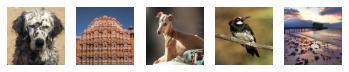

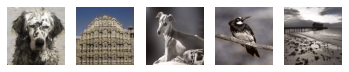

validation Output: 


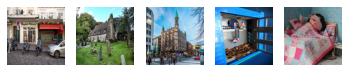

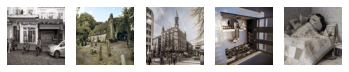


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2550.pth.
Train Epoch: 2551 [0/256 (0%)]	UNetLoss: 0.080333
Train Epoch: 2552 [0/256 (0%)]	UNetLoss: 0.086133
Train Epoch: 2553 [0/256 (0%)]	UNetLoss: 0.083877
Train Epoch: 2554 [0/256 (0%)]	UNetLoss: 0.105445
Train Epoch: 2555 [0/256 (0%)]	UNetLoss: 0.085477
Train Epoch: 2556 [0/256 (0%)]	UNetLoss: 0.093273
Train Epoch: 2557 [0/256 (0%)]	UNetLoss: 0.079250
Train Epoch: 2558 [0/256 (0%)]	UNetLoss: 0.087799
Train Epoch: 2559 [0/256 (0%)]	UNetLoss: 0.087100
Train Epoch: 2560 [0/256 (0%)]	UNetLoss: 0.084586
Train Epoch: 2561 [0/256 (0%)]	UNetLoss: 0.114142
Train Epoch: 2562 [0/256 (0%)]	UNetLoss: 0.085737
Train Epoch: 2563 [0/256 (0%)]	UNetLoss: 0.091296
Train Epoch: 2564 [0/256 (0%)]	UNetLoss: 0.081484
Train Epoch: 2565 [0/256 (0%)]	UNetLoss: 0.089034
Train Epoch: 2566 [0/256 (0%)]	UNetLoss: 0.096676
Train Epoch: 2567 [0/256 (0%)]	UNetLoss: 0.106894
Train Epoch: 2568 [0/256 (0%)]	UNetLoss: 0.094337
Train Epoch: 2569 

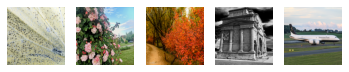

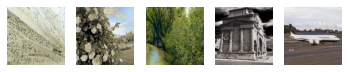

validation Output: 


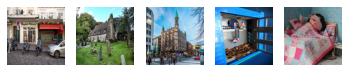

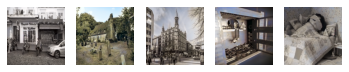


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2600.pth.
Train Epoch: 2601 [0/256 (0%)]	UNetLoss: 0.087471
Train Epoch: 2602 [0/256 (0%)]	UNetLoss: 0.087474
Train Epoch: 2603 [0/256 (0%)]	UNetLoss: 0.084873
Train Epoch: 2604 [0/256 (0%)]	UNetLoss: 0.084503
Train Epoch: 2605 [0/256 (0%)]	UNetLoss: 0.093122
Train Epoch: 2606 [0/256 (0%)]	UNetLoss: 0.089097
Train Epoch: 2607 [0/256 (0%)]	UNetLoss: 0.085441
Train Epoch: 2608 [0/256 (0%)]	UNetLoss: 0.080447
Train Epoch: 2609 [0/256 (0%)]	UNetLoss: 0.079117
Train Epoch: 2610 [0/256 (0%)]	UNetLoss: 0.074515
Train Epoch: 2611 [0/256 (0%)]	UNetLoss: 0.095623
Train Epoch: 2612 [0/256 (0%)]	UNetLoss: 0.081082
Train Epoch: 2613 [0/256 (0%)]	UNetLoss: 0.077509
Train Epoch: 2614 [0/256 (0%)]	UNetLoss: 0.083212
Train Epoch: 2615 [0/256 (0%)]	UNetLoss: 0.079596
Train Epoch: 2616 [0/256 (0%)]	UNetLoss: 0.091184
Train Epoch: 2617 [0/256 (0%)]	UNetLoss: 0.095224
Train Epoch: 2618 [0/256 (0%)]	UNetLoss: 0.083883
Train Epoch: 2619 

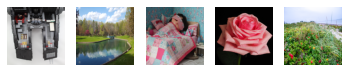

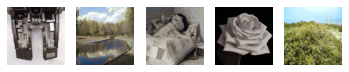

validation Output: 


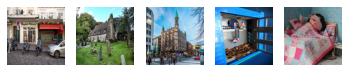

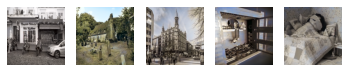


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2650.pth.
Train Epoch: 2651 [0/256 (0%)]	UNetLoss: 0.080343
Train Epoch: 2652 [0/256 (0%)]	UNetLoss: 0.073754
Train Epoch: 2653 [0/256 (0%)]	UNetLoss: 0.085653
Train Epoch: 2654 [0/256 (0%)]	UNetLoss: 0.080771
Train Epoch: 2655 [0/256 (0%)]	UNetLoss: 0.076312
Train Epoch: 2656 [0/256 (0%)]	UNetLoss: 0.100818
Train Epoch: 2657 [0/256 (0%)]	UNetLoss: 0.096980
Train Epoch: 2658 [0/256 (0%)]	UNetLoss: 0.093980
Train Epoch: 2659 [0/256 (0%)]	UNetLoss: 0.089919
Train Epoch: 2660 [0/256 (0%)]	UNetLoss: 0.086057
Train Epoch: 2661 [0/256 (0%)]	UNetLoss: 0.072604
Train Epoch: 2662 [0/256 (0%)]	UNetLoss: 0.072396
Train Epoch: 2663 [0/256 (0%)]	UNetLoss: 0.084090
Train Epoch: 2664 [0/256 (0%)]	UNetLoss: 0.089199
Train Epoch: 2665 [0/256 (0%)]	UNetLoss: 0.078680
Train Epoch: 2666 [0/256 (0%)]	UNetLoss: 0.076559
Train Epoch: 2667 [0/256 (0%)]	UNetLoss: 0.079323
Train Epoch: 2668 [0/256 (0%)]	UNetLoss: 0.093377
Train Epoch: 2669 

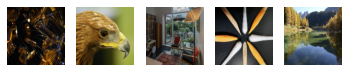

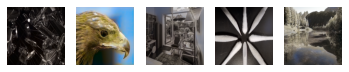

validation Output: 


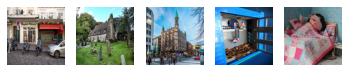

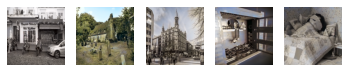


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2700.pth.
Train Epoch: 2701 [0/256 (0%)]	UNetLoss: 0.109565
Train Epoch: 2702 [0/256 (0%)]	UNetLoss: 0.074922
Train Epoch: 2703 [0/256 (0%)]	UNetLoss: 0.084970
Train Epoch: 2704 [0/256 (0%)]	UNetLoss: 0.082439
Train Epoch: 2705 [0/256 (0%)]	UNetLoss: 0.081103
Train Epoch: 2706 [0/256 (0%)]	UNetLoss: 0.084919
Train Epoch: 2707 [0/256 (0%)]	UNetLoss: 0.087994
Train Epoch: 2708 [0/256 (0%)]	UNetLoss: 0.081236
Train Epoch: 2709 [0/256 (0%)]	UNetLoss: 0.090140
Train Epoch: 2710 [0/256 (0%)]	UNetLoss: 0.089621
Train Epoch: 2711 [0/256 (0%)]	UNetLoss: 0.084968
Train Epoch: 2712 [0/256 (0%)]	UNetLoss: 0.087002
Train Epoch: 2713 [0/256 (0%)]	UNetLoss: 0.091224
Train Epoch: 2714 [0/256 (0%)]	UNetLoss: 0.083942
Train Epoch: 2715 [0/256 (0%)]	UNetLoss: 0.090105
Train Epoch: 2716 [0/256 (0%)]	UNetLoss: 0.090538
Train Epoch: 2717 [0/256 (0%)]	UNetLoss: 0.077943
Train Epoch: 2718 [0/256 (0%)]	UNetLoss: 0.079366
Train Epoch: 2719 

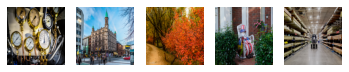

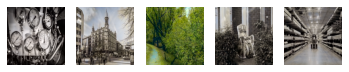

validation Output: 


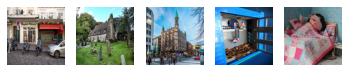

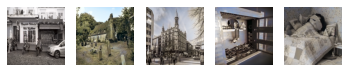


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2750.pth.
Train Epoch: 2751 [0/256 (0%)]	UNetLoss: 0.099262
Train Epoch: 2752 [0/256 (0%)]	UNetLoss: 0.091733
Train Epoch: 2753 [0/256 (0%)]	UNetLoss: 0.085947
Train Epoch: 2754 [0/256 (0%)]	UNetLoss: 0.079661
Train Epoch: 2755 [0/256 (0%)]	UNetLoss: 0.076773
Train Epoch: 2756 [0/256 (0%)]	UNetLoss: 0.078461
Train Epoch: 2757 [0/256 (0%)]	UNetLoss: 0.076230
Train Epoch: 2758 [0/256 (0%)]	UNetLoss: 0.091749
Train Epoch: 2759 [0/256 (0%)]	UNetLoss: 0.086360
Train Epoch: 2760 [0/256 (0%)]	UNetLoss: 0.097074
Train Epoch: 2761 [0/256 (0%)]	UNetLoss: 0.086876
Train Epoch: 2762 [0/256 (0%)]	UNetLoss: 0.087097
Train Epoch: 2763 [0/256 (0%)]	UNetLoss: 0.085900
Train Epoch: 2764 [0/256 (0%)]	UNetLoss: 0.088409
Train Epoch: 2765 [0/256 (0%)]	UNetLoss: 0.080437
Train Epoch: 2766 [0/256 (0%)]	UNetLoss: 0.084687
Train Epoch: 2767 [0/256 (0%)]	UNetLoss: 0.097164
Train Epoch: 2768 [0/256 (0%)]	UNetLoss: 0.095659
Train Epoch: 2769 

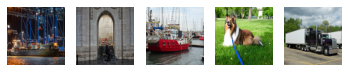

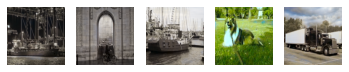

validation Output: 


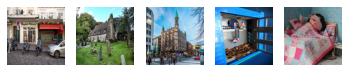

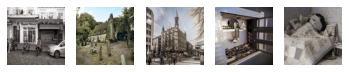


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttentionUNet_2800.pth.
Train Epoch: 2801 [0/256 (0%)]	UNetLoss: 0.084707
Train Epoch: 2802 [0/256 (0%)]	UNetLoss: 0.078107
Train Epoch: 2803 [0/256 (0%)]	UNetLoss: 0.095424
Train Epoch: 2804 [0/256 (0%)]	UNetLoss: 0.091927
Train Epoch: 2805 [0/256 (0%)]	UNetLoss: 0.090742


KeyboardInterrupt: 

In [13]:
train_model(5000, model)

In [14]:
saveModel(model, '/home/hd2585/ondemand/cv-project/attnunet/AttnUNet_2.8k.pth')


Saved model to /home/hd2585/ondemand/cv-project/attnunet/AttnUNet_2.8k.pth.


In [45]:
# model = UNet(ResidualBlock)
# model.to(device)
# model.load_state_dict(torch.load('/home/hd2585/ondemand/cv-project/attnunet/AttnUNet_2.8k.pth'))

loss_list = np.array(torch.load('/home/hd2585/ondemand/cv-project/attnunet/attentionunet_training_loss.pth')) / 8

In [53]:
for (X_batch, y_batch) in train_loader:
    img_X = X_batch
    img_y = y_batch
    break

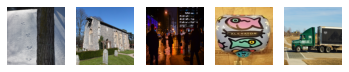

In [54]:
imshow(img_X, img_y)

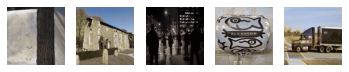

In [55]:
imshow(img_X, model(img_X.to(device)).to('cpu'))        # Experiment 1 with relu and leakyrelu, and all residual blocks

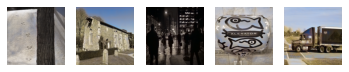

In [56]:
imshow(img_X, model(img_X.to(device)).to('cpu'))        # Experiment 2 with relu, and all residual blocks

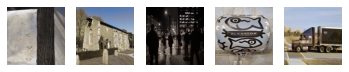

In [57]:
imshow(img_X, model(img_X.to(device)).to('cpu'))        # Experiment 3 with relu and leakyrelu, and innermost residual layer removed

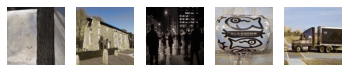

In [58]:
imshow(img_X, model(img_X.to(device)).to('cpu'))        # With batchnorms everywhere; seems like residual layers are too heavyweight; will consider convs next

In [37]:
# Validation Output
i= 0
c= 1
for (X_batch, y_batch) in val_loader:
    val_img_X = X_batch
    val_img_y = y_batch
    if(i == c):
        break;
    i+= 1

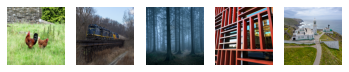

In [38]:
imshow(val_img_X, val_img_y)

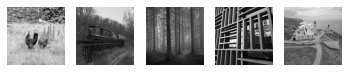

In [39]:
imshow(val_img_X, torch.tensor(0.0).expand_as(val_img_y))

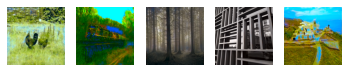

In [40]:
imshow(val_img_X, model(val_img_X.to(device)).to('cpu'))

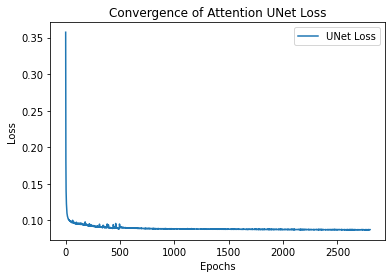

In [46]:
# Plotting of unet loss with respect to number of epochs
plt.plot(loss_list, label='UNet Loss')
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Convergence of Attention UNet Loss")
plt.show()

In [47]:
val_unet_loss = val_model(model, False)

In [48]:
print("Validation set UNet Loss: ", val_unet_loss)

Validation set UNet Loss:  0.12494567088782788


In [49]:
print("Training set UNet Loss: ", loss_list[-1])

Training set UNet Loss:  0.08740528486669064
